In [ ]:
%load_ext autoreload
%autoreload 2

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install pyro-ppl
!pip install pot
!pip install tensorboard
!pip install torchdiffeq

  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl.metadata (1.8 kB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-manylinu

In [ ]:
!rm -rf PFNExperiments
!git clone https://github.com/ArikReuter/PFNExperiments

Cloning into 'PFNExperiments'...
remote: Enumerating objects: 1316, done.
remote: Counting objects: 100% (89/89), done.
remote: Compressing objects: 100% (64/64), done.
remote: Total 1316 (delta 50), reused 57 (delta 25), pack-reused 1227
Receiving objects: 100% (1316/1316), 57.47 MiB | 10.90 MiB/s, done.
Resolving deltas: 100% (934/934), done.


In [ ]:
import torch
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataLM_Examples import make_lm_program_ig_batched, make_lm_program_ig

from PFNExperiments.LinearRegression.GenerativeModels.LM_abstract import return_only_y, print_code
from PFNExperiments.Training.Trainer import visualize_training_results
from PFNExperiments.Training.FlowMatching.CFMLossOTGaussianBase_plus_NLL import CFMLossOTGaussianBase_plus_NLL
from PFNExperiments.LinearRegression.ComparisonModels.Hamiltionion_MC import Hamiltionian_MC
from PFNExperiments.LinearRegression.ComparisonModels.Variational_Inference import Variational_Inference
from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.GenerativeModels.Curriculum import Curriculum
from PFNExperiments.LinearRegression.GenerativeModels.GenerateDataCurriculumCFM import GenerateDataCurriculumCFM
from PFNExperiments.Training.TrainerCurriculumCNF_LearnedBaseDist_plus_nll import TrainerCurriculumCNF_LearnedBaseDist_plus_nll

from PFNExperiments.LinearRegression.Evaluation.CompareComparisonModels import CompareComparisonModels
from PFNExperiments.LinearRegression.Models.ModelToPosteriorCNF_LearnedBaseDist import ModelToPosteriorCNF_LearnedBaseDist
from PFNExperiments.LinearRegression.Models.Transformer import MLP
from PFNExperiments.LinearRegression.Models.ModelPosterior import ModelPosteriorFullGaussian2
from PFNExperiments.LinearRegression.Models.Transformer_CNF_DoubleCondition2 import TransformerDecoderConditionalDouble_parallel, MLPConditionalDouble_parallel
from PFNExperiments.LinearRegression.Models.Transformer_CNF_LearnedBaseDistribution import TransformerReturnRepresentations, TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2, TransformerPlusNLP
from PFNExperiments.LinearRegression.ComparisonModels.AnalyticalSolutionsLM import PosteriorLM_IG
from PFNExperiments.Evaluation.Evaluate import Evaluate

from PFNExperiments.LinearRegression.ComparisonModels.Variational_InferenceAutoguide import Variational_InferenceAutoguide

from pyro.infer.autoguide import AutoDiagonalNormal, AutoMultivariateNormal, AutoLaplaceApproximation, AutoIAFNormal, AutoStructured

In [ ]:
torch.backends.cudnn.benchmark = True

In [ ]:
N = 100
P = 10
BATCH_SIZE = 1024
N_EPOCHS = 100
N_SAMPLES_PER_EPOCH = 500_000
N_BATCHES_PER_EPOCH = N_SAMPLES_PER_EPOCH//BATCH_SIZE
SAVE_PATH = "/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM"
SAVE_PATH_EVALUATION = f"{SAVE_PATH}/PFN_Experiments_CFM_InverseGamma_coupling_LearnedBaseDist_plus_nll_v2"
#BATCH_SIZE = 128



In [ ]:
a = 5.0
b = 2.0
tau = 1.0

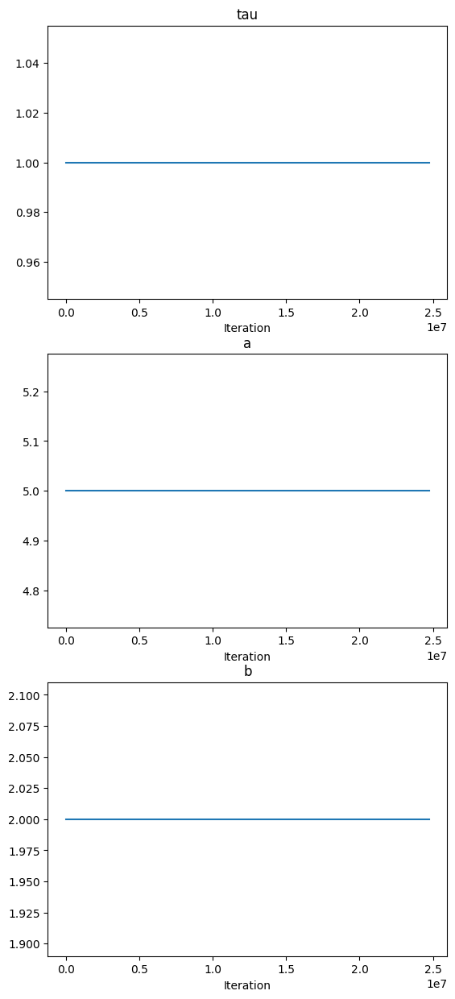

In [ ]:
curriculum = Curriculum(max_iter=int(N_EPOCHS*N_BATCHES_PER_EPOCH*BATCH_SIZE*0.5))
curriculum.add_param_list(
    [
    ("tau", curriculum.constant_scheduler(tau)),
    ("a", curriculum.constant_scheduler(a)),
    ("b", curriculum.constant_scheduler(b)),

    ]
)
curriculum.plot_all_schedules()

In [ ]:
curriculum.get_params(299*N_SAMPLES_PER_EPOCH)

{'tau': 1.0, 'a': 5.0, 'b': 2.0}

In [ ]:
data_generator = GenerateDataCurriculumCFM(
    pprogram_maker= make_lm_program_ig_batched,
    curriculum= curriculum,
    #coupling = None
)

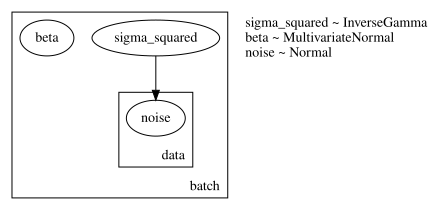

In [ ]:
data_generator.render_model()

In [ ]:
epoch_loader = data_generator.make_epoch_loader(
    n = N,
    p = P,
    number_of_batches_per_epoch = N_BATCHES_PER_EPOCH,
    n_epochs = N_EPOCHS,
    batch_size= BATCH_SIZE,
    train_frac= 0.5,
    val_frac= 0.1,
    shuffle=False,
    n_samples_to_generate_at_once = 250_000
)

The number of batches times the number of epochs must be equal to the total number of iterations in the curriculum. But got 49971200 and 24985600 respectively


In [ ]:
sample_batch = next(iter(epoch_loader[0][0]))

In [ ]:
sample_batch.keys()

dict_keys(['x', 'y', 'sigma_squared', 'beta', 'time', 'base_sample_beta'])

In [ ]:
#save_path_model = "/content/drive/MyDrive/PFN_Experiments/Training_Runs/experiment_2024_05_29_07_37_35/model.pth"

In [ ]:
model_posterior = ModelPosteriorFullGaussian2(cov_reg_factor = 1e-3, use_lowrank_normal = False, diag_transform = lambda x: x**2)

nll_loss = model_posterior.negative_log_likelihood
nll_loss_avg = model_posterior.negative_log_likelihood_avg
nll_loss_std = model_posterior.negative_log_likelihood_std
nll_loss_median = model_posterior.negative_log_likelihood_median

encoder = TransformerReturnRepresentations(
    n_features= P+1,
    seq_len= N,
    d_model= 384,
    n_heads= 6,
    dim_feedforward=384*2,
    dropout_rate = 0.1,
    n_layers=7,
    n_skip_layers_final_heads = 3,
    n_output_units_per_head=[P, P*P, P]
)

encoder_to_process_encoder_output = torch.nn.TransformerEncoder(
    torch.nn.TransformerEncoderLayer(d_model=encoder.d_model,
                                     nhead=encoder.n_heads,
                                     dim_feedforward = encoder.dim_feedforward,
                                     batch_first = True,
                                     norm_first = True),
    num_layers=4)


#encoder.load_state_dict(torch.load(save_path_model, map_location=torch.device('cpu')))
# get the correct class to transform model predictions to posterior samples


mlp_to_process_encoder_output = MLP(
    n_input_units = encoder.d_model,
    n_output_units= 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)

model_to_process_encoder_output_for_decoder = TransformerPlusNLP(
    transformer_encoder = encoder_to_process_encoder_output,
    mlp = mlp_to_process_encoder_output
)


mlp_to_process_time_conditioning = MLP(
    n_input_units = 1,
    n_output_units = 512,
    n_hidden_units= 512,
    n_skip_layers= 2,
    dropout_rate = 0.1
)
decoder = TransformerDecoderConditionalDouble_parallel(
    n_input_features= P,
    d_model_decoder= 512,
    d_model_encoder= encoder.d_model,
    n_heads= 4,
    d_ff = 512,
    dropout= 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units,
    n_layers= 4,
    use_positional_encoding=False,
    use_self_attention=False,
)
mlp_to_process_decoder_output = MLPConditionalDouble_parallel(
    n_input_units= decoder.d_model_decoder,
    n_output_units = P,
    n_hidden_units = 512,
    n_skip_layers = 2,
    dropout_rate = 0.1,
    n_condition_features_a = mlp_to_process_encoder_output.n_output_units,
    n_condition_features_b = mlp_to_process_time_conditioning.n_output_units
)
model = TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
    encoder = encoder,
    model_posterior = model_posterior,
    model_to_process_encoder_output = model_to_process_encoder_output_for_decoder,
    mlp_to_process_time_conditioning = mlp_to_process_time_conditioning,
    mlp_to_process_decoder_output = mlp_to_process_decoder_output,
    decoder = decoder,
    freeze_encoder=False,
)



/usr/local/lib/python3.10/dist-packages/torch/nn/modules/transformer.py:306: UserWarning: enable_nested_tensor is True, but self.use_nested_tensor is False because encoder_layer.norm_first was True
  warnings.warn(f"enable_nested_tensor is True, but self.use_nested_tensor is False because {why_not_sparsity_fast_path}")


In [ ]:
def count_parameters(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

In [ ]:
'{:.2e}'.format(count_parameters(model))

'5.31e+07'

In [ ]:
import torch
from torch.optim.lr_scheduler import ReduceLROnPlateau, OneCycleLR

In [ ]:
lr = 1e-4
opt = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=1e-5)

In [ ]:
loss_fun = CFMLossOTGaussianBase_plus_NLL(
    weight_nll = 0.5,
    NLL_Loss_function= nll_loss,
    sigma_min=0.0,
    return_sub_losses=True
)

In [ ]:
scheduler = OneCycleLR(opt,
                       max_lr = 1e-4,
                       epochs = N_EPOCHS,
                       steps_per_epoch = N_SAMPLES_PER_EPOCH//BATCH_SIZE,
                       pct_start = 0.1,
                       div_factor=25.0,
                       final_div_factor=1e2)

#scheduler = ReduceLROnPlateau(opt)

additional_evals = {
    "nll_loss": nll_loss,
    "nll_loss_avg": nll_loss_avg,
    "nll_loss_std": nll_loss_std,
    "nll_loss_median": nll_loss_median
}

In [ ]:
#?TrainerCurriculumCNF

In [ ]:
trainer = TrainerCurriculumCNF_LearnedBaseDist_plus_nll(
    model = model,
    optimizer=opt,
    scheduler = scheduler,
    loss_function=loss_fun,
    epoch_loader = epoch_loader,
    evaluation_functions= additional_evals,
    n_epochs = N_EPOCHS,
    early_stopping_patience = 200,
    schedule_step_on = "batch",
    save_path = SAVE_PATH,
    use_same_timestep_per_batch = False,
    use_train_mode_during_validation = False,
    sub_losses_names = ["loss_FM", "loss_NLL"],
    coupling = None

)

In [ ]:
trainer.set_new_save_path("/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_25_17_37_42")
trainer.save_path

'/content/drive/MyDrive/PFN_Experiments/Training_RunsCFM/experiment_2024_07_25_17_37_42'

In [ ]:
try:
  trainer.load_best_model()
except:
  print("Could not load model")
  pass

In [ ]:
trainer.validate()

100%|██████████| 49/49 [00:15<00:00,  3.22it/s]


{'loss_mean': 193.48150634765625,
 'loss_median': 193.44651794433594,
 'loss_std': 4.891941547393799,
 'loss_FM_mean': 1.1920872926712036,
 'loss_FM_median': 1.1923526525497437,
 'loss_FM_std': 0.01649770326912403,
 'loss_NLL_mean': 385.7708740234375,
 'loss_NLL_median': 385.6941833496094,
 'loss_NLL_std': 9.774856567382812}

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/runs

<IPython.core.display.Javascript object>

In [ ]:
r = trainer.train()

Curriculum parameters: {'tau': 1.0, 'a': 5.0, 'b': 2.0} at iteration 0


100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 0:
Training: {'loss_mean': 11.111138343811035, 'loss_median': 10.985774993896484, 'loss_std': 0.6875979900360107, 'loss_FM_mean': 4.564270496368408, 'loss_FM_median': 4.569414138793945, 'loss_FM_std': 0.4884166717529297, 'loss_NLL_mean': 17.658002853393555, 'loss_NLL_median': 17.372116088867188, 'loss_NLL_std': 0.9279967546463013}
Validation: {'loss_mean': 8.274291038513184, 'loss_median': 8.270604133605957, 'loss_std': 0.07094745337963104, 'loss_FM_mean': 1.9057936668395996, 'loss_FM_median': 1.8970069885253906, 'loss_FM_std': 0.03978230059146881, 'loss_NLL_mean': 14.642788887023926, 'loss_NLL_median': 14.643266677856445, 'loss_NLL_std': 0.12730377912521362}
Validation curriculum: {'loss_mean': 8.297173500061035, 'loss_median': 8.280207633972168, 'loss_std': 0.16511748731136322, 'loss_FM_mean': 1.9560084342956543, 'loss_FM_median': 1.8978712558746338, 'loss_FM_std': 0.2964876592159271, 'loss_NLL_mean': 14.638338088989258, 'loss_NLL_median': 14.66047477722168, 'loss_NLL_std': 0.1

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 1:
Training: {'loss_mean': 9.649175643920898, 'loss_median': 9.693587303161621, 'loss_std': 0.36617493629455566, 'loss_FM_mean': 3.3163552284240723, 'loss_FM_median': 3.3044793605804443, 'loss_FM_std': 0.2688930630683899, 'loss_NLL_mean': 15.981996536254883, 'loss_NLL_median': 16.061237335205078, 'loss_NLL_std': 0.4730128347873688}
Validation: {'loss_mean': 7.361393451690674, 'loss_median': 7.340286731719971, 'loss_std': 0.09304419904947281, 'loss_FM_mean': 1.582879662513733, 'loss_FM_median': 1.5548648834228516, 'loss_FM_std': 0.12126678973436356, 'loss_NLL_mean': 13.13990592956543, 'loss_NLL_median': 13.120392799377441, 'loss_NLL_std': 0.11569170653820038}
Validation curriculum: {'loss_mean': 7.3513102531433105, 'loss_median': 7.350519180297852, 'loss_std': 0.07330009341239929, 'loss_FM_mean': 1.5545144081115723, 'loss_FM_median': 1.5546449422836304, 'loss_FM_std': 0.03568889945745468, 'loss_NLL_mean': 13.148106575012207, 'loss_NLL_median': 13.149140357971191, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 2:
Training: {'loss_mean': 7.5962042808532715, 'loss_median': 7.622260570526123, 'loss_std': 0.8386377096176147, 'loss_FM_mean': 2.3246219158172607, 'loss_FM_median': 2.2965056896209717, 'loss_FM_std': 0.3038216531276703, 'loss_NLL_mean': 12.867785453796387, 'loss_NLL_median': 12.949162483215332, 'loss_NLL_std': 1.3788502216339111}
Validation: {'loss_mean': 4.638730525970459, 'loss_median': 4.622802734375, 'loss_std': 0.07585542649030685, 'loss_FM_mean': 0.8170278668403625, 'loss_FM_median': 0.8180292248725891, 'loss_FM_std': 0.012738725170493126, 'loss_NLL_mean': 8.460433959960938, 'loss_NLL_median': 8.430461883544922, 'loss_NLL_std': 0.1474786251783371}
Validation curriculum: {'loss_mean': 4.653573989868164, 'loss_median': 4.6553754806518555, 'loss_std': 0.06985313445329666, 'loss_FM_mean': 0.8178666830062866, 'loss_FM_median': 0.8184911608695984, 'loss_FM_std': 0.01789376512169838, 'loss_NLL_mean': 8.489280700683594, 'loss_NLL_median': 8.497903823852539, 'loss_NLL_std': 0.1312

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 3:
Training: {'loss_mean': 5.214977741241455, 'loss_median': 5.142775535583496, 'loss_std': 0.5023482441902161, 'loss_FM_mean': 1.569413661956787, 'loss_FM_median': 1.567063570022583, 'loss_FM_std': 0.15426556766033173, 'loss_NLL_mean': 8.860541343688965, 'loss_NLL_median': 8.733487129211426, 'loss_NLL_std': 0.8703397512435913}
Validation: {'loss_mean': 3.0710320472717285, 'loss_median': 3.062117338180542, 'loss_std': 0.05335512384772301, 'loss_FM_mean': 0.5116978883743286, 'loss_FM_median': 0.5101276636123657, 'loss_FM_std': 0.015242190100252628, 'loss_NLL_mean': 5.630366325378418, 'loss_NLL_median': 5.6171674728393555, 'loss_NLL_std': 0.09599655866622925}
Validation curriculum: {'loss_mean': 3.0746402740478516, 'loss_median': 3.0738978385925293, 'loss_std': 0.06714508682489395, 'loss_FM_mean': 0.5124877095222473, 'loss_FM_median': 0.5091748237609863, 'loss_FM_std': 0.015573784708976746, 'loss_NLL_mean': 5.6367926597595215, 'loss_NLL_median': 5.647936820983887, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 4:
Training: {'loss_mean': 4.048895835876465, 'loss_median': 4.0459394454956055, 'loss_std': 0.27033472061157227, 'loss_FM_mean': 1.2685679197311401, 'loss_FM_median': 1.2616288661956787, 'loss_FM_std': 0.11896806955337524, 'loss_NLL_mean': 6.829224586486816, 'loss_NLL_median': 6.811251640319824, 'loss_NLL_std': 0.4691723585128784}
Validation: {'loss_mean': 2.663325786590576, 'loss_median': 2.6591739654541016, 'loss_std': 0.04766681790351868, 'loss_FM_mean': 0.4399960935115814, 'loss_FM_median': 0.44102317094802856, 'loss_FM_std': 0.01752386800944805, 'loss_NLL_mean': 4.886655330657959, 'loss_NLL_median': 4.884071350097656, 'loss_NLL_std': 0.08478671312332153}
Validation curriculum: {'loss_mean': 2.6834146976470947, 'loss_median': 2.689990282058716, 'loss_std': 0.05531942844390869, 'loss_FM_mean': 0.4428739845752716, 'loss_FM_median': 0.44119498133659363, 'loss_FM_std': 0.014087292365729809, 'loss_NLL_mean': 4.92395544052124, 'loss_NLL_median': 4.930752754211426, 'loss_NLL_std': 

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 5:
Training: {'loss_mean': 3.4629411697387695, 'loss_median': 3.46567964553833, 'loss_std': 0.19048477709293365, 'loss_FM_mean': 1.1129283905029297, 'loss_FM_median': 1.108472466468811, 'loss_FM_std': 0.11093557626008987, 'loss_NLL_mean': 5.812953948974609, 'loss_NLL_median': 5.797396659851074, 'loss_NLL_std': 0.3315470814704895}
Validation: {'loss_mean': 2.3025095462799072, 'loss_median': 2.2927520275115967, 'loss_std': 0.04780871793627739, 'loss_FM_mean': 0.38188856840133667, 'loss_FM_median': 0.3803407549858093, 'loss_FM_std': 0.01271461509168148, 'loss_NLL_mean': 4.223130226135254, 'loss_NLL_median': 4.214731693267822, 'loss_NLL_std': 0.08604320138692856}
Validation curriculum: {'loss_mean': 2.318582534790039, 'loss_median': 2.315396547317505, 'loss_std': 0.04557614400982857, 'loss_FM_mean': 0.3867790699005127, 'loss_FM_median': 0.38705113530158997, 'loss_FM_std': 0.01222485862672329, 'loss_NLL_mean': 4.2503862380981445, 'loss_NLL_median': 4.2448410987854, 'loss_NLL_std': 0.0

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 6:
Training: {'loss_mean': 3.1638343334198, 'loss_median': 3.1280577182769775, 'loss_std': 0.23381195962429047, 'loss_FM_mean': 1.024721384048462, 'loss_FM_median': 1.01284658908844, 'loss_FM_std': 0.11147035658359528, 'loss_NLL_mean': 5.3029465675354, 'loss_NLL_median': 5.218108177185059, 'loss_NLL_std': 0.41494929790496826}
Validation: {'loss_mean': 2.2888338565826416, 'loss_median': 2.2848129272460938, 'loss_std': 0.06114790588617325, 'loss_FM_mean': 0.3912487030029297, 'loss_FM_median': 0.39042654633522034, 'loss_FM_std': 0.0189838744699955, 'loss_NLL_mean': 4.1864190101623535, 'loss_NLL_median': 4.181576728820801, 'loss_NLL_std': 0.1084422618150711}
Validation curriculum: {'loss_mean': 2.2861433029174805, 'loss_median': 2.2844078540802, 'loss_std': 0.07012474536895752, 'loss_FM_mean': 0.392159104347229, 'loss_FM_median': 0.39255425333976746, 'loss_FM_std': 0.02357475459575653, 'loss_NLL_mean': 4.1801276206970215, 'loss_NLL_median': 4.165394306182861, 'loss_NLL_std': 0.121150

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 7:
Training: {'loss_mean': 2.8836822509765625, 'loss_median': 2.849879026412964, 'loss_std': 0.1843048632144928, 'loss_FM_mean': 0.9467019438743591, 'loss_FM_median': 0.9381120800971985, 'loss_FM_std': 0.10766775906085968, 'loss_NLL_mean': 4.820662975311279, 'loss_NLL_median': 4.748581886291504, 'loss_NLL_std': 0.3299863040447235}
Validation: {'loss_mean': 2.4069736003875732, 'loss_median': 2.404503345489502, 'loss_std': 0.052652329206466675, 'loss_FM_mean': 0.406882643699646, 'loss_FM_median': 0.40805402398109436, 'loss_FM_std': 0.02296242117881775, 'loss_NLL_mean': 4.407064437866211, 'loss_NLL_median': 4.406337261199951, 'loss_NLL_std': 0.08853090554475784}
Validation curriculum: {'loss_mean': 2.3997135162353516, 'loss_median': 2.3864755630493164, 'loss_std': 0.06106969341635704, 'loss_FM_mean': 0.409274160861969, 'loss_FM_median': 0.41101333498954773, 'loss_FM_std': 0.02401459589600563, 'loss_NLL_mean': 4.390152931213379, 'loss_NLL_median': 4.366945266723633, 'loss_NLL_std': 0

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 8:
Training: {'loss_mean': 2.685180902481079, 'loss_median': 2.642648220062256, 'loss_std': 0.24423693120479584, 'loss_FM_mean': 0.8954818248748779, 'loss_FM_median': 0.8887161612510681, 'loss_FM_std': 0.10854525864124298, 'loss_NLL_mean': 4.474879741668701, 'loss_NLL_median': 4.409502029418945, 'loss_NLL_std': 0.44073525071144104}
Validation: {'loss_mean': 2.1703622341156006, 'loss_median': 2.1685147285461426, 'loss_std': 0.06973946839570999, 'loss_FM_mean': 0.40228819847106934, 'loss_FM_median': 0.40363630652427673, 'loss_FM_std': 0.0284567978233099, 'loss_NLL_mean': 3.9384357929229736, 'loss_NLL_median': 3.9236562252044678, 'loss_NLL_std': 0.12012283504009247}
Validation curriculum: {'loss_mean': 2.1699769496917725, 'loss_median': 2.167689561843872, 'loss_std': 0.061506010591983795, 'loss_FM_mean': 0.4021035432815552, 'loss_FM_median': 0.403674453496933, 'loss_FM_std': 0.02742103487253189, 'loss_NLL_mean': 3.937849998474121, 'loss_NLL_median': 3.9385759830474854, 'loss_NLL_std

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 9:
Training: {'loss_mean': 2.4744484424591064, 'loss_median': 2.4456517696380615, 'loss_std': 0.21810151636600494, 'loss_FM_mean': 0.8509976267814636, 'loss_FM_median': 0.8329014182090759, 'loss_FM_std': 0.12217225134372711, 'loss_NLL_mean': 4.097899436950684, 'loss_NLL_median': 4.037330627441406, 'loss_NLL_std': 0.3756891191005707}
Validation: {'loss_mean': 2.038761615753174, 'loss_median': 2.029853582382202, 'loss_std': 0.06781964749097824, 'loss_FM_mean': 0.4038982689380646, 'loss_FM_median': 0.40092405676841736, 'loss_FM_std': 0.03254583105444908, 'loss_NLL_mean': 3.6736249923706055, 'loss_NLL_median': 3.6686487197875977, 'loss_NLL_std': 0.10956413298845291}
Validation curriculum: {'loss_mean': 2.018101692199707, 'loss_median': 2.0212411880493164, 'loss_std': 0.06308700144290924, 'loss_FM_mean': 0.39535826444625854, 'loss_FM_median': 0.3886522054672241, 'loss_FM_std': 0.03410205617547035, 'loss_NLL_mean': 3.6408448219299316, 'loss_NLL_median': 3.631324529647827, 'loss_NLL_std

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 10:
Training: {'loss_mean': 2.2371644973754883, 'loss_median': 2.1934735774993896, 'loss_std': 0.27309107780456543, 'loss_FM_mean': 0.8142547607421875, 'loss_FM_median': 0.8034608960151672, 'loss_FM_std': 0.10981317609548569, 'loss_NLL_mean': 3.6600747108459473, 'loss_NLL_median': 3.596825361251831, 'loss_NLL_std': 0.49640706181526184}
Validation: {'loss_mean': 1.3662492036819458, 'loss_median': 1.3549140691757202, 'loss_std': 0.06488558650016785, 'loss_FM_mean': 0.32323601841926575, 'loss_FM_median': 0.3189862370491028, 'loss_FM_std': 0.02575928345322609, 'loss_NLL_mean': 2.4092626571655273, 'loss_NLL_median': 2.387216329574585, 'loss_NLL_std': 0.1134592667222023}
Validation curriculum: {'loss_mean': 1.3621704578399658, 'loss_median': 1.3546866178512573, 'loss_std': 0.05123345926403999, 'loss_FM_mean': 0.3182189464569092, 'loss_FM_median': 0.3136872351169586, 'loss_FM_std': 0.0223618783056736, 'loss_NLL_mean': 2.4061219692230225, 'loss_NLL_median': 2.4101271629333496, 'loss_NLL_

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 11:
Training: {'loss_mean': 1.8603646755218506, 'loss_median': 1.8566246032714844, 'loss_std': 0.33930423855781555, 'loss_FM_mean': 0.7405027747154236, 'loss_FM_median': 0.7333263754844666, 'loss_FM_std': 0.10433851182460785, 'loss_NLL_mean': 2.9802262783050537, 'loss_NLL_median': 2.9964709281921387, 'loss_NLL_std': 0.6265801191329956}
Validation: {'loss_mean': 1.1766259670257568, 'loss_median': 1.1779654026031494, 'loss_std': 0.07193521410226822, 'loss_FM_mean': 0.3216853737831116, 'loss_FM_median': 0.3160528838634491, 'loss_FM_std': 0.03593393787741661, 'loss_NLL_mean': 2.031566619873047, 'loss_NLL_median': 2.0327553749084473, 'loss_NLL_std': 0.11835205554962158}
Validation curriculum: {'loss_mean': 1.1701538562774658, 'loss_median': 1.1554347276687622, 'loss_std': 0.07258766889572144, 'loss_FM_mean': 0.3191715180873871, 'loss_FM_median': 0.31647512316703796, 'loss_FM_std': 0.03152044117450714, 'loss_NLL_mean': 2.0211362838745117, 'loss_NLL_median': 1.994158387184143, 'loss_NLL

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 12:
Training: {'loss_mean': 1.1241772174835205, 'loss_median': 1.0708153247833252, 'loss_std': 0.2962145507335663, 'loss_FM_mean': 0.6772326827049255, 'loss_FM_median': 0.6615778803825378, 'loss_FM_std': 0.10022647678852081, 'loss_NLL_mean': 1.5711220502853394, 'loss_NLL_median': 1.4849231243133545, 'loss_NLL_std': 0.5455937385559082}
Validation: {'loss_mean': 0.33906933665275574, 'loss_median': 0.3472594618797302, 'loss_std': 0.05934746190905571, 'loss_FM_mean': 0.22182750701904297, 'loss_FM_median': 0.2235518991947174, 'loss_FM_std': 0.022795869037508965, 'loss_NLL_mean': 0.4563111364841461, 'loss_NLL_median': 0.46850138902664185, 'loss_NLL_std': 0.10877145826816559}
Validation curriculum: {'loss_mean': 0.33325427770614624, 'loss_median': 0.32966917753219604, 'loss_std': 0.06704847514629364, 'loss_FM_mean': 0.22529390454292297, 'loss_FM_median': 0.2212563008069992, 'loss_FM_std': 0.026042284443974495, 'loss_NLL_mean': 0.4412147104740143, 'loss_NLL_median': 0.422806978225708, 'l

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 13:
Training: {'loss_mean': 0.7285830974578857, 'loss_median': 0.710416316986084, 'loss_std': 0.17124196887016296, 'loss_FM_mean': 0.6262189745903015, 'loss_FM_median': 0.615881621837616, 'loss_FM_std': 0.0921747013926506, 'loss_NLL_mean': 0.8309472799301147, 'loss_NLL_median': 0.8021537661552429, 'loss_NLL_std': 0.32002198696136475}
Validation: {'loss_mean': 0.2754984498023987, 'loss_median': 0.27177804708480835, 'loss_std': 0.085568867623806, 'loss_FM_mean': 0.29223284125328064, 'loss_FM_median': 0.2882048189640045, 'loss_FM_std': 0.04566003382205963, 'loss_NLL_mean': 0.25876399874687195, 'loss_NLL_median': 0.25044941902160645, 'loss_NLL_std': 0.13912290334701538}
Validation curriculum: {'loss_mean': 0.2671128809452057, 'loss_median': 0.26311221718788147, 'loss_std': 0.10007714480161667, 'loss_FM_mean': 0.2917972505092621, 'loss_FM_median': 0.28724709153175354, 'loss_FM_std': 0.047445088624954224, 'loss_NLL_mean': 0.2424284815788269, 'loss_NLL_median': 0.25796425342559814, 'los

100%|██████████| 49/49 [00:14<00:00,  3.34it/s]


Epoch 14:
Training: {'loss_mean': 0.6090513467788696, 'loss_median': 0.5404180288314819, 'loss_std': 0.4170718789100647, 'loss_FM_mean': 0.6134771704673767, 'loss_FM_median': 0.5927324891090393, 'loss_FM_std': 0.11146622151136398, 'loss_NLL_mean': 0.6046255230903625, 'loss_NLL_median': 0.4821602404117584, 'loss_NLL_std': 0.7903196215629578}
Validation: {'loss_mean': 0.0966489240527153, 'loss_median': 0.104583740234375, 'loss_std': 0.06304463744163513, 'loss_FM_mean': 0.22992122173309326, 'loss_FM_median': 0.21605229377746582, 'loss_FM_std': 0.05265659838914871, 'loss_NLL_mean': -0.03662336990237236, 'loss_NLL_median': -0.04015189781785011, 'loss_NLL_std': 0.10153604298830032}
Validation curriculum: {'loss_mean': 0.08546454459428787, 'loss_median': 0.08731213212013245, 'loss_std': 0.07349483668804169, 'loss_FM_mean': 0.23375916481018066, 'loss_FM_median': 0.2312694638967514, 'loss_FM_std': 0.04995192587375641, 'loss_NLL_mean': -0.06283006817102432, 'loss_NLL_median': -0.0594572499394416

100%|██████████| 49/49 [00:15<00:00,  3.27it/s]


Epoch 15:
Training: {'loss_mean': 0.5652130246162415, 'loss_median': 0.407701313495636, 'loss_std': 0.9630705118179321, 'loss_FM_mean': 0.5978589057922363, 'loss_FM_median': 0.5670866370201111, 'loss_FM_std': 0.19628937542438507, 'loss_NLL_mean': 0.5325670838356018, 'loss_NLL_median': 0.24508588016033173, 'loss_NLL_std': 1.7687244415283203}
Validation: {'loss_mean': -0.6582010388374329, 'loss_median': -0.6688859462738037, 'loss_std': 0.06870952993631363, 'loss_FM_mean': 0.2258831113576889, 'loss_FM_median': 0.21307317912578583, 'loss_FM_std': 0.046693820506334305, 'loss_NLL_mean': -1.5422852039337158, 'loss_NLL_median': -1.547229290008545, 'loss_NLL_std': 0.10596302151679993}
Validation curriculum: {'loss_mean': -0.65329509973526, 'loss_median': -0.6570788025856018, 'loss_std': 0.06298264116048813, 'loss_FM_mean': 0.2255013883113861, 'loss_FM_median': 0.22333192825317383, 'loss_FM_std': 0.04178005829453468, 'loss_NLL_mean': -1.5320916175842285, 'loss_NLL_median': -1.5362040996551514, '

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 16:
Training: {'loss_mean': 0.48381757736206055, 'loss_median': 0.32798588275909424, 'loss_std': 0.6336405277252197, 'loss_FM_mean': 0.5759078860282898, 'loss_FM_median': 0.5624517798423767, 'loss_FM_std': 0.13188856840133667, 'loss_NLL_mean': 0.39172717928886414, 'loss_NLL_median': 0.10958944261074066, 'loss_NLL_std': 1.2102028131484985}
Validation: {'loss_mean': 0.3133482336997986, 'loss_median': 0.3329355716705322, 'loss_std': 0.11056889593601227, 'loss_FM_mean': 0.4956006705760956, 'loss_FM_median': 0.4786643087863922, 'loss_FM_std': 0.1273408681154251, 'loss_NLL_mean': 0.1310957968235016, 'loss_NLL_median': 0.15037569403648376, 'loss_NLL_std': 0.12733396887779236}
Validation curriculum: {'loss_mean': 0.3464217185974121, 'loss_median': 0.34012436866760254, 'loss_std': 0.11980866640806198, 'loss_FM_mean': 0.5327398777008057, 'loss_FM_median': 0.5116894245147705, 'loss_FM_std': 0.11436169594526291, 'loss_NLL_mean': 0.16010364890098572, 'loss_NLL_median': 0.135112464427948, 'los

100%|██████████| 49/49 [00:14<00:00,  3.31it/s]


Epoch 17:
Training: {'loss_mean': 0.3496764004230499, 'loss_median': 0.21276147663593292, 'loss_std': 0.8113033771514893, 'loss_FM_mean': 0.5616388916969299, 'loss_FM_median': 0.524315357208252, 'loss_FM_std': 0.1820591539144516, 'loss_NLL_mean': 0.13771384954452515, 'loss_NLL_median': -0.11207438260316849, 'loss_NLL_std': 1.4883878231048584}
Validation: {'loss_mean': -0.40727636218070984, 'loss_median': -0.39839455485343933, 'loss_std': 0.08300301432609558, 'loss_FM_mean': 0.2528551518917084, 'loss_FM_median': 0.2557442784309387, 'loss_FM_std': 0.05883818119764328, 'loss_NLL_mean': -1.0674078464508057, 'loss_NLL_median': -1.0661351680755615, 'loss_NLL_std': 0.1351756900548935}
Validation curriculum: {'loss_mean': -0.4070643186569214, 'loss_median': -0.39038315415382385, 'loss_std': 0.07740256190299988, 'loss_FM_mean': 0.23448266088962555, 'loss_FM_median': 0.2241670936346054, 'loss_FM_std': 0.06179573014378548, 'loss_NLL_mean': -1.0486112833023071, 'loss_NLL_median': -1.04014539718627

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 18:
Training: {'loss_mean': 0.2351292073726654, 'loss_median': 0.14280682802200317, 'loss_std': 0.4825080931186676, 'loss_FM_mean': 0.5326976180076599, 'loss_FM_median': 0.5206633806228638, 'loss_FM_std': 0.11786753684282303, 'loss_NLL_mean': -0.062439192086458206, 'loss_NLL_median': -0.2547418177127838, 'loss_NLL_std': 0.9130054712295532}
Validation: {'loss_mean': -0.4201410114765167, 'loss_median': -0.4306214451789856, 'loss_std': 0.08680810779333115, 'loss_FM_mean': 0.437334269285202, 'loss_FM_median': 0.4245627522468567, 'loss_FM_std': 0.10114865005016327, 'loss_NLL_mean': -1.277616262435913, 'loss_NLL_median': -1.2903773784637451, 'loss_NLL_std': 0.10199777036905289}
Validation curriculum: {'loss_mean': -0.41531360149383545, 'loss_median': -0.4481452405452728, 'loss_std': 0.1174921914935112, 'loss_FM_mean': 0.44816046953201294, 'loss_FM_median': 0.40779057145118713, 'loss_FM_std': 0.11985107511281967, 'loss_NLL_mean': -1.278787612915039, 'loss_NLL_median': -1.311721086502075

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 19:
Training: {'loss_mean': 0.17443636059761047, 'loss_median': 0.08998385816812515, 'loss_std': 0.5672799944877625, 'loss_FM_mean': 0.5216683149337769, 'loss_FM_median': 0.49947166442871094, 'loss_FM_std': 0.12378755211830139, 'loss_NLL_mean': -0.1727956086397171, 'loss_NLL_median': -0.33407148718833923, 'loss_NLL_std': 1.0549579858779907}
Validation: {'loss_mean': -0.881414532661438, 'loss_median': -0.8865613341331482, 'loss_std': 0.07945573329925537, 'loss_FM_mean': 0.2509506940841675, 'loss_FM_median': 0.2526622414588928, 'loss_FM_std': 0.05179200693964958, 'loss_NLL_mean': -2.013779878616333, 'loss_NLL_median': -2.024104118347168, 'loss_NLL_std': 0.12158232927322388}
Validation curriculum: {'loss_mean': -0.8928929567337036, 'loss_median': -0.8940703868865967, 'loss_std': 0.09092706441879272, 'loss_FM_mean': 0.24693630635738373, 'loss_FM_median': 0.24442219734191895, 'loss_FM_std': 0.060906779021024704, 'loss_NLL_mean': -2.032722234725952, 'loss_NLL_median': -2.06179928779602

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 20:
Training: {'loss_mean': 0.04416556656360626, 'loss_median': -0.0011391788721084595, 'loss_std': 0.24180364608764648, 'loss_FM_mean': 0.5079385042190552, 'loss_FM_median': 0.4920182228088379, 'loss_FM_std': 0.09891733527183533, 'loss_NLL_mean': -0.41960737109184265, 'loss_NLL_median': -0.5208405256271362, 'loss_NLL_std': 0.4572749435901642}
Validation: {'loss_mean': -0.5548501014709473, 'loss_median': -0.5683954358100891, 'loss_std': 0.07809954136610031, 'loss_FM_mean': 0.14940379559993744, 'loss_FM_median': 0.14824946224689484, 'loss_FM_std': 0.02264527790248394, 'loss_NLL_mean': -1.2591040134429932, 'loss_NLL_median': -1.281872272491455, 'loss_NLL_std': 0.14357133209705353}
Validation curriculum: {'loss_mean': -0.5554814338684082, 'loss_median': -0.5633055567741394, 'loss_std': 0.08418425172567368, 'loss_FM_mean': 0.1445695161819458, 'loss_FM_median': 0.13853728771209717, 'loss_FM_std': 0.02545800246298313, 'loss_NLL_mean': -1.2555322647094727, 'loss_NLL_median': -1.27469253

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 21:
Training: {'loss_mean': 0.020805399864912033, 'loss_median': -0.06035110354423523, 'loss_std': 0.484524130821228, 'loss_FM_mean': 0.5014129281044006, 'loss_FM_median': 0.4795936048030853, 'loss_FM_std': 0.12544411420822144, 'loss_NLL_mean': -0.45980215072631836, 'loss_NLL_median': -0.6287851929664612, 'loss_NLL_std': 0.913408637046814}
Validation: {'loss_mean': -0.7543962597846985, 'loss_median': -0.7668132185935974, 'loss_std': 0.07650747150182724, 'loss_FM_mean': 0.2006267011165619, 'loss_FM_median': 0.19088372588157654, 'loss_FM_std': 0.047052767127752304, 'loss_NLL_mean': -1.7094188928604126, 'loss_NLL_median': -1.7177128791809082, 'loss_NLL_std': 0.12242228537797928}
Validation curriculum: {'loss_mean': -0.7378491759300232, 'loss_median': -0.7265730500221252, 'loss_std': 0.07511752843856812, 'loss_FM_mean': 0.20730583369731903, 'loss_FM_median': 0.19954931735992432, 'loss_FM_std': 0.052263665944337845, 'loss_NLL_mean': -1.6830042600631714, 'loss_NLL_median': -1.662267327

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 22:
Training: {'loss_mean': -0.08991193026304245, 'loss_median': -0.10883429646492004, 'loss_std': 0.20826663076877594, 'loss_FM_mean': 0.46415776014328003, 'loss_FM_median': 0.4586324691772461, 'loss_FM_std': 0.09008290618658066, 'loss_NLL_mean': -0.6439815759658813, 'loss_NLL_median': -0.7023951411247253, 'loss_NLL_std': 0.39032113552093506}
Validation: {'loss_mean': -0.5169721841812134, 'loss_median': -0.5249759554862976, 'loss_std': 0.08088881522417068, 'loss_FM_mean': 0.17136408388614655, 'loss_FM_median': 0.16742482781410217, 'loss_FM_std': 0.025400664657354355, 'loss_NLL_mean': -1.2053085565567017, 'loss_NLL_median': -1.2168428897857666, 'loss_NLL_std': 0.14686323702335358}
Validation curriculum: {'loss_mean': -0.511770486831665, 'loss_median': -0.5160306096076965, 'loss_std': 0.06280860304832458, 'loss_FM_mean': 0.168803870677948, 'loss_FM_median': 0.16906380653381348, 'loss_FM_std': 0.023909103125333786, 'loss_NLL_mean': -1.1923447847366333, 'loss_NLL_median': -1.1913704

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 23:
Training: {'loss_mean': -0.11009538173675537, 'loss_median': -0.18253852427005768, 'loss_std': 0.40180036425590515, 'loss_FM_mean': 0.4566752016544342, 'loss_FM_median': 0.44678646326065063, 'loss_FM_std': 0.0998978540301323, 'loss_NLL_mean': -0.6768659949302673, 'loss_NLL_median': -0.8202365636825562, 'loss_NLL_std': 0.7531196475028992}
Validation: {'loss_mean': -0.4067111015319824, 'loss_median': -0.40365469455718994, 'loss_std': 0.07577140629291534, 'loss_FM_mean': 0.2529788911342621, 'loss_FM_median': 0.2455826848745346, 'loss_FM_std': 0.050483498722314835, 'loss_NLL_mean': -1.0664011240005493, 'loss_NLL_median': -1.0667986869812012, 'loss_NLL_std': 0.12578853964805603}
Validation curriculum: {'loss_mean': -0.40521761775016785, 'loss_median': -0.4016149640083313, 'loss_std': 0.07166283577680588, 'loss_FM_mean': 0.2624985873699188, 'loss_FM_median': 0.25604864954948425, 'loss_FM_std': 0.050625383853912354, 'loss_NLL_mean': -1.0729337930679321, 'loss_NLL_median': -1.0697715

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 24:
Training: {'loss_mean': -0.20219174027442932, 'loss_median': -0.2443447709083557, 'loss_std': 0.2351493388414383, 'loss_FM_mean': 0.442440390586853, 'loss_FM_median': 0.4277978837490082, 'loss_FM_std': 0.10194813460111618, 'loss_NLL_mean': -0.8468238711357117, 'loss_NLL_median': -0.9339579343795776, 'loss_NLL_std': 0.4289114773273468}
Validation: {'loss_mean': -1.1100291013717651, 'loss_median': -1.1067856550216675, 'loss_std': 0.06501070410013199, 'loss_FM_mean': 0.1589859426021576, 'loss_FM_median': 0.1532852202653885, 'loss_FM_std': 0.03107401356101036, 'loss_NLL_mean': -2.3790440559387207, 'loss_NLL_median': -2.3667688369750977, 'loss_NLL_std': 0.11048828065395355}
Validation curriculum: {'loss_mean': -1.1155872344970703, 'loss_median': -1.1113810539245605, 'loss_std': 0.06652455776929855, 'loss_FM_mean': 0.1575206071138382, 'loss_FM_median': 0.15476225316524506, 'loss_FM_std': 0.020534731447696686, 'loss_NLL_mean': -2.388695240020752, 'loss_NLL_median': -2.38668990135192

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 25:
Training: {'loss_mean': -0.2164497673511505, 'loss_median': -0.24805594980716705, 'loss_std': 0.2572651505470276, 'loss_FM_mean': 0.44278353452682495, 'loss_FM_median': 0.4284979999065399, 'loss_FM_std': 0.09726481884717941, 'loss_NLL_mean': -0.8756831288337708, 'loss_NLL_median': -0.9577896595001221, 'loss_NLL_std': 0.47507813572883606}
Validation: {'loss_mean': -0.9055529832839966, 'loss_median': -0.9160845875740051, 'loss_std': 0.08598045259714127, 'loss_FM_mean': 0.25061488151550293, 'loss_FM_median': 0.24203626811504364, 'loss_FM_std': 0.07225380092859268, 'loss_NLL_mean': -2.061720848083496, 'loss_NLL_median': -2.074414014816284, 'loss_NLL_std': 0.12422537803649902}
Validation curriculum: {'loss_mean': -0.9144007563591003, 'loss_median': -0.9277313947677612, 'loss_std': 0.0816202163696289, 'loss_FM_mean': 0.24315015971660614, 'loss_FM_median': 0.23277512192726135, 'loss_FM_std': 0.062171757221221924, 'loss_NLL_mean': -2.0719516277313232, 'loss_NLL_median': -2.0931587219

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 26:
Training: {'loss_mean': -0.2838877737522125, 'loss_median': -0.3096098303794861, 'loss_std': 0.18779732286930084, 'loss_FM_mean': 0.4199962615966797, 'loss_FM_median': 0.4055183529853821, 'loss_FM_std': 0.09242896735668182, 'loss_NLL_mean': -0.9877716898918152, 'loss_NLL_median': -1.0357673168182373, 'loss_NLL_std': 0.3623385727405548}
Validation: {'loss_mean': -1.3386473655700684, 'loss_median': -1.3552517890930176, 'loss_std': 0.08345391601324081, 'loss_FM_mean': 0.174399271607399, 'loss_FM_median': 0.16928842663764954, 'loss_FM_std': 0.04432700574398041, 'loss_NLL_mean': -2.851694107055664, 'loss_NLL_median': -2.8664374351501465, 'loss_NLL_std': 0.13948021829128265}
Validation curriculum: {'loss_mean': -1.343833565711975, 'loss_median': -1.3412292003631592, 'loss_std': 0.08210279047489166, 'loss_FM_mean': 0.1768721342086792, 'loss_FM_median': 0.16995678842067719, 'loss_FM_std': 0.044858913868665695, 'loss_NLL_mean': -2.864539384841919, 'loss_NLL_median': -2.859547138214111

100%|██████████| 49/49 [00:15<00:00,  3.27it/s]


Epoch 27:
Training: {'loss_mean': -0.32625889778137207, 'loss_median': -0.35003623366355896, 'loss_std': 0.17856734991073608, 'loss_FM_mean': 0.4298582673072815, 'loss_FM_median': 0.4217154085636139, 'loss_FM_std': 0.09085860103368759, 'loss_NLL_mean': -1.0823761224746704, 'loss_NLL_median': -1.1257824897766113, 'loss_NLL_std': 0.3333936929702759}
Validation: {'loss_mean': -1.2488536834716797, 'loss_median': -1.2388060092926025, 'loss_std': 0.06927207857370377, 'loss_FM_mean': 0.15315291285514832, 'loss_FM_median': 0.15478168427944183, 'loss_FM_std': 0.031838469207286835, 'loss_NLL_mean': -2.65086030960083, 'loss_NLL_median': -2.6527652740478516, 'loss_NLL_std': 0.122453972697258}
Validation curriculum: {'loss_mean': -1.2499486207962036, 'loss_median': -1.2629646062850952, 'loss_std': 0.05802123621106148, 'loss_FM_mean': 0.15386401116847992, 'loss_FM_median': 0.15156887471675873, 'loss_FM_std': 0.027956800535321236, 'loss_NLL_mean': -2.653761148452759, 'loss_NLL_median': -2.68313932418

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 28:
Training: {'loss_mean': -0.3331718444824219, 'loss_median': -0.36357733607292175, 'loss_std': 0.19119049608707428, 'loss_FM_mean': 0.4148770570755005, 'loss_FM_median': 0.39963823556900024, 'loss_FM_std': 0.09139828383922577, 'loss_NLL_mean': -1.0812206268310547, 'loss_NLL_median': -1.1373183727264404, 'loss_NLL_std': 0.35253071784973145}
Validation: {'loss_mean': -1.3451509475708008, 'loss_median': -1.3475396633148193, 'loss_std': 0.06480397284030914, 'loss_FM_mean': 0.15482144057750702, 'loss_FM_median': 0.14950571954250336, 'loss_FM_std': 0.023898275569081306, 'loss_NLL_mean': -2.845123291015625, 'loss_NLL_median': -2.859166145324707, 'loss_NLL_std': 0.11852607131004333}
Validation curriculum: {'loss_mean': -1.3355101346969604, 'loss_median': -1.3283718824386597, 'loss_std': 0.06439759582281113, 'loss_FM_mean': 0.15412932634353638, 'loss_FM_median': 0.15190242230892181, 'loss_FM_std': 0.024478081613779068, 'loss_NLL_mean': -2.8251495361328125, 'loss_NLL_median': -2.8072490

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 29:
Training: {'loss_mean': -0.3787372410297394, 'loss_median': -0.4115292429924011, 'loss_std': 0.19982533156871796, 'loss_FM_mean': 0.3963334560394287, 'loss_FM_median': 0.38317179679870605, 'loss_FM_std': 0.09837173670530319, 'loss_NLL_mean': -1.1538078784942627, 'loss_NLL_median': -1.2069382667541504, 'loss_NLL_std': 0.3595379889011383}
Validation: {'loss_mean': -1.3435359001159668, 'loss_median': -1.3465229272842407, 'loss_std': 0.07122032344341278, 'loss_FM_mean': 0.1763245165348053, 'loss_FM_median': 0.16989509761333466, 'loss_FM_std': 0.05169980973005295, 'loss_NLL_mean': -2.863396167755127, 'loss_NLL_median': -2.872255325317383, 'loss_NLL_std': 0.1187911406159401}
Validation curriculum: {'loss_mean': -1.3508766889572144, 'loss_median': -1.3568181991577148, 'loss_std': 0.07579261064529419, 'loss_FM_mean': 0.17989283800125122, 'loss_FM_median': 0.17729710042476654, 'loss_FM_std': 0.04706991836428642, 'loss_NLL_mean': -2.881645917892456, 'loss_NLL_median': -2.89807367324829

100%|██████████| 49/49 [00:14<00:00,  3.28it/s]


Epoch 30:
Training: {'loss_mean': -0.41082391142845154, 'loss_median': -0.4332258105278015, 'loss_std': 0.1419263631105423, 'loss_FM_mean': 0.39290857315063477, 'loss_FM_median': 0.3824969530105591, 'loss_FM_std': 0.08420701324939728, 'loss_NLL_mean': -1.214556336402893, 'loss_NLL_median': -1.2558987140655518, 'loss_NLL_std': 0.2708343267440796}
Validation: {'loss_mean': -1.271884560585022, 'loss_median': -1.2806106805801392, 'loss_std': 0.09820620715618134, 'loss_FM_mean': 0.21935708820819855, 'loss_FM_median': 0.2077106088399887, 'loss_FM_std': 0.07723779231309891, 'loss_NLL_mean': -2.7631263732910156, 'loss_NLL_median': -2.751664638519287, 'loss_NLL_std': 0.14439821243286133}
Validation curriculum: {'loss_mean': -1.2459520101547241, 'loss_median': -1.2399415969848633, 'loss_std': 0.09988605976104736, 'loss_FM_mean': 0.24505621194839478, 'loss_FM_median': 0.2319854497909546, 'loss_FM_std': 0.08974920958280563, 'loss_NLL_mean': -2.7369606494903564, 'loss_NLL_median': -2.71886253356933

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 31:
Training: {'loss_mean': -0.43983834981918335, 'loss_median': -0.4549904465675354, 'loss_std': 0.16109809279441833, 'loss_FM_mean': 0.3841702938079834, 'loss_FM_median': 0.37839221954345703, 'loss_FM_std': 0.08385482430458069, 'loss_NLL_mean': -1.26384699344635, 'loss_NLL_median': -1.3097383975982666, 'loss_NLL_std': 0.29124730825424194}
Validation: {'loss_mean': -1.2867913246154785, 'loss_median': -1.2893807888031006, 'loss_std': 0.0669589564204216, 'loss_FM_mean': 0.18297334015369415, 'loss_FM_median': 0.17338287830352783, 'loss_FM_std': 0.041128724813461304, 'loss_NLL_mean': -2.7565560340881348, 'loss_NLL_median': -2.7702784538269043, 'loss_NLL_std': 0.1115274578332901}
Validation curriculum: {'loss_mean': -1.2840403318405151, 'loss_median': -1.2831710577011108, 'loss_std': 0.0704389214515686, 'loss_FM_mean': 0.18553458154201508, 'loss_FM_median': 0.18338172137737274, 'loss_FM_std': 0.04443499445915222, 'loss_NLL_mean': -2.753615379333496, 'loss_NLL_median': -2.750763416290

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 32:
Training: {'loss_mean': -0.45698466897010803, 'loss_median': -0.4891018867492676, 'loss_std': 0.17691360414028168, 'loss_FM_mean': 0.37687748670578003, 'loss_FM_median': 0.3688291907310486, 'loss_FM_std': 0.08575017750263214, 'loss_NLL_mean': -1.290846824645996, 'loss_NLL_median': -1.343817114830017, 'loss_NLL_std': 0.32115495204925537}
Validation: {'loss_mean': -1.2085915803909302, 'loss_median': -1.2112374305725098, 'loss_std': 0.07035033404827118, 'loss_FM_mean': 0.20466271042823792, 'loss_FM_median': 0.19765937328338623, 'loss_FM_std': 0.04405149444937706, 'loss_NLL_mean': -2.6218457221984863, 'loss_NLL_median': -2.6150999069213867, 'loss_NLL_std': 0.11539433896541595}
Validation curriculum: {'loss_mean': -1.2367732524871826, 'loss_median': -1.2361699342727661, 'loss_std': 0.07386689633131027, 'loss_FM_mean': 0.19456146657466888, 'loss_FM_median': 0.17660534381866455, 'loss_FM_std': 0.05647541955113411, 'loss_NLL_mean': -2.6681079864501953, 'loss_NLL_median': -2.643790483

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 33:
Training: {'loss_mean': -0.4767380356788635, 'loss_median': -0.5083771347999573, 'loss_std': 0.2029612958431244, 'loss_FM_mean': 0.3748929798603058, 'loss_FM_median': 0.36053529381752014, 'loss_FM_std': 0.08735352009534836, 'loss_NLL_mean': -1.3283690214157104, 'loss_NLL_median': -1.3944642543792725, 'loss_NLL_std': 0.39223602414131165}
Validation: {'loss_mean': -1.4157047271728516, 'loss_median': -1.4201903343200684, 'loss_std': 0.0877419263124466, 'loss_FM_mean': 0.2134796380996704, 'loss_FM_median': 0.1990751475095749, 'loss_FM_std': 0.06158251687884331, 'loss_NLL_mean': -3.044889211654663, 'loss_NLL_median': -3.0618996620178223, 'loss_NLL_std': 0.1348082274198532}
Validation curriculum: {'loss_mean': -1.4047863483428955, 'loss_median': -1.402843713760376, 'loss_std': 0.08697133511304855, 'loss_FM_mean': 0.24070465564727783, 'loss_FM_median': 0.22871482372283936, 'loss_FM_std': 0.07009576261043549, 'loss_NLL_mean': -3.0502777099609375, 'loss_NLL_median': -3.052427291870117

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 34:
Training: {'loss_mean': -0.4884170591831207, 'loss_median': -0.5213184356689453, 'loss_std': 0.25174662470817566, 'loss_FM_mean': 0.3629544675350189, 'loss_FM_median': 0.35009440779685974, 'loss_FM_std': 0.08113473653793335, 'loss_NLL_mean': -1.3397884368896484, 'loss_NLL_median': -1.4149911403656006, 'loss_NLL_std': 0.4790094494819641}
Validation: {'loss_mean': -0.9771561026573181, 'loss_median': -0.9772390723228455, 'loss_std': 0.07615319639444351, 'loss_FM_mean': 0.17454807460308075, 'loss_FM_median': 0.17014871537685394, 'loss_FM_std': 0.036476824432611465, 'loss_NLL_mean': -2.1288602352142334, 'loss_NLL_median': -2.117042064666748, 'loss_NLL_std': 0.13100583851337433}
Validation curriculum: {'loss_mean': -0.980731725692749, 'loss_median': -0.9771251678466797, 'loss_std': 0.0849665105342865, 'loss_FM_mean': 0.18127477169036865, 'loss_FM_median': 0.17510640621185303, 'loss_FM_std': 0.04560079425573349, 'loss_NLL_mean': -2.142738103866577, 'loss_NLL_median': -2.130677938461

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 35:
Training: {'loss_mean': -0.5462681651115417, 'loss_median': -0.5622071027755737, 'loss_std': 0.12258750200271606, 'loss_FM_mean': 0.353290855884552, 'loss_FM_median': 0.3419858515262604, 'loss_FM_std': 0.07345917075872421, 'loss_NLL_mean': -1.4458271265029907, 'loss_NLL_median': -1.4901621341705322, 'loss_NLL_std': 0.23755355179309845}
Validation: {'loss_mean': -1.1799829006195068, 'loss_median': -1.182561993598938, 'loss_std': 0.07539094984531403, 'loss_FM_mean': 0.18228787183761597, 'loss_FM_median': 0.1666971892118454, 'loss_FM_std': 0.045308761298656464, 'loss_NLL_mean': -2.5422534942626953, 'loss_NLL_median': -2.5483646392822266, 'loss_NLL_std': 0.12255147099494934}
Validation curriculum: {'loss_mean': -1.1816326379776, 'loss_median': -1.1899735927581787, 'loss_std': 0.07916076481342316, 'loss_FM_mean': 0.1782461404800415, 'loss_FM_median': 0.17721472680568695, 'loss_FM_std': 0.04415478929877281, 'loss_NLL_mean': -2.5415115356445312, 'loss_NLL_median': -2.548922061920166

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 36:
Training: {'loss_mean': -0.567319393157959, 'loss_median': -0.5928842425346375, 'loss_std': 0.12571178376674652, 'loss_FM_mean': 0.3438710570335388, 'loss_FM_median': 0.33863839507102966, 'loss_FM_std': 0.06808801740407944, 'loss_NLL_mean': -1.4785099029541016, 'loss_NLL_median': -1.5180426836013794, 'loss_NLL_std': 0.23982416093349457}
Validation: {'loss_mean': -1.0741055011749268, 'loss_median': -1.0863505601882935, 'loss_std': 0.06431326270103455, 'loss_FM_mean': 0.1710195094347, 'loss_FM_median': 0.16468827426433563, 'loss_FM_std': 0.04366138577461243, 'loss_NLL_mean': -2.319230318069458, 'loss_NLL_median': -2.320044755935669, 'loss_NLL_std': 0.11036161333322525}
Validation curriculum: {'loss_mean': -1.0697048902511597, 'loss_median': -1.0794399976730347, 'loss_std': 0.06893555074930191, 'loss_FM_mean': 0.16321562230587006, 'loss_FM_median': 0.15668867528438568, 'loss_FM_std': 0.035494912415742874, 'loss_NLL_mean': -2.3026254177093506, 'loss_NLL_median': -2.30633807182312

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 37:
Training: {'loss_mean': -0.5629793405532837, 'loss_median': -0.5803452730178833, 'loss_std': 0.14421479403972626, 'loss_FM_mean': 0.34804150462150574, 'loss_FM_median': 0.33652588725090027, 'loss_FM_std': 0.07517653703689575, 'loss_NLL_mean': -1.474000096321106, 'loss_NLL_median': -1.497198462486267, 'loss_NLL_std': 0.2749421298503876}
Validation: {'loss_mean': -1.2085895538330078, 'loss_median': -1.2047897577285767, 'loss_std': 0.07875638455152512, 'loss_FM_mean': 0.19517891108989716, 'loss_FM_median': 0.18936172127723694, 'loss_FM_std': 0.047100797295570374, 'loss_NLL_mean': -2.6123576164245605, 'loss_NLL_median': -2.611144542694092, 'loss_NLL_std': 0.12962599098682404}
Validation curriculum: {'loss_mean': -1.2287156581878662, 'loss_median': -1.220744252204895, 'loss_std': 0.08085865527391434, 'loss_FM_mean': 0.18611806631088257, 'loss_FM_median': 0.18112139403820038, 'loss_FM_std': 0.038002271205186844, 'loss_NLL_mean': -2.6435494422912598, 'loss_NLL_median': -2.6198849678

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 38:
Training: {'loss_mean': -0.5858436226844788, 'loss_median': -0.5999621152877808, 'loss_std': 0.12118645757436752, 'loss_FM_mean': 0.3455929458141327, 'loss_FM_median': 0.332629531621933, 'loss_FM_std': 0.08200123906135559, 'loss_NLL_mean': -1.517280101776123, 'loss_NLL_median': -1.5534392595291138, 'loss_NLL_std': 0.21882882714271545}
Validation: {'loss_mean': -1.4005070924758911, 'loss_median': -1.4099438190460205, 'loss_std': 0.09481349587440491, 'loss_FM_mean': 0.2135349065065384, 'loss_FM_median': 0.20668728649616241, 'loss_FM_std': 0.06556787341833115, 'loss_NLL_mean': -3.0145490169525146, 'loss_NLL_median': -3.045988082885742, 'loss_NLL_std': 0.14193861186504364}
Validation curriculum: {'loss_mean': -1.411672830581665, 'loss_median': -1.406326413154602, 'loss_std': 0.10617496073246002, 'loss_FM_mean': 0.20047155022621155, 'loss_FM_median': 0.18905942142009735, 'loss_FM_std': 0.06854254752397537, 'loss_NLL_mean': -3.0238170623779297, 'loss_NLL_median': -3.003134965896606

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 39:
Training: {'loss_mean': -0.5969359874725342, 'loss_median': -0.6284169554710388, 'loss_std': 0.13340520858764648, 'loss_FM_mean': 0.3495195209980011, 'loss_FM_median': 0.32773467898368835, 'loss_FM_std': 0.0971878245472908, 'loss_NLL_mean': -1.5433915853500366, 'loss_NLL_median': -1.5909934043884277, 'loss_NLL_std': 0.24615484476089478}
Validation: {'loss_mean': -1.293778657913208, 'loss_median': -1.2999969720840454, 'loss_std': 0.07824946939945221, 'loss_FM_mean': 0.1845281571149826, 'loss_FM_median': 0.177559956908226, 'loss_FM_std': 0.04780043289065361, 'loss_NLL_mean': -2.772085428237915, 'loss_NLL_median': -2.7859694957733154, 'loss_NLL_std': 0.132358580827713}
Validation curriculum: {'loss_mean': -1.2904138565063477, 'loss_median': -1.3016090393066406, 'loss_std': 0.08624200522899628, 'loss_FM_mean': 0.18217593431472778, 'loss_FM_median': 0.16015610098838806, 'loss_FM_std': 0.06566248834133148, 'loss_NLL_mean': -2.7630035877227783, 'loss_NLL_median': -2.7722151279449463

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 40:
Training: {'loss_mean': -0.59296715259552, 'loss_median': -0.6094475984573364, 'loss_std': 0.12883825600147247, 'loss_FM_mean': 0.34013631939888, 'loss_FM_median': 0.3179349899291992, 'loss_FM_std': 0.08901950716972351, 'loss_NLL_mean': -1.5260707139968872, 'loss_NLL_median': -1.5598266124725342, 'loss_NLL_std': 0.2332361936569214}
Validation: {'loss_mean': -1.1507295370101929, 'loss_median': -1.1557867527008057, 'loss_std': 0.05650230497121811, 'loss_FM_mean': 0.1449626237154007, 'loss_FM_median': 0.14461280405521393, 'loss_FM_std': 0.024434441700577736, 'loss_NLL_mean': -2.4464216232299805, 'loss_NLL_median': -2.472135543823242, 'loss_NLL_std': 0.1013774499297142}
Validation curriculum: {'loss_mean': -1.1463289260864258, 'loss_median': -1.1593602895736694, 'loss_std': 0.0668264776468277, 'loss_FM_mean': 0.14317259192466736, 'loss_FM_median': 0.14051860570907593, 'loss_FM_std': 0.024924106895923615, 'loss_NLL_mean': -2.4358303546905518, 'loss_NLL_median': -2.452606201171875,

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 41:
Training: {'loss_mean': -0.6250292658805847, 'loss_median': -0.6373000741004944, 'loss_std': 0.12658637762069702, 'loss_FM_mean': 0.3331238925457001, 'loss_FM_median': 0.31562477350234985, 'loss_FM_std': 0.0837249830365181, 'loss_NLL_mean': -1.583182454109192, 'loss_NLL_median': -1.5963491201400757, 'loss_NLL_std': 0.23059403896331787}
Validation: {'loss_mean': -1.6691573858261108, 'loss_median': -1.668683409690857, 'loss_std': 0.08071848005056381, 'loss_FM_mean': 0.18264231085777283, 'loss_FM_median': 0.18638458847999573, 'loss_FM_std': 0.05263679102063179, 'loss_NLL_mean': -3.5209574699401855, 'loss_NLL_median': -3.505175828933716, 'loss_NLL_std': 0.13170969486236572}
Validation curriculum: {'loss_mean': -1.6713556051254272, 'loss_median': -1.6865931749343872, 'loss_std': 0.07227504253387451, 'loss_FM_mean': 0.1796591877937317, 'loss_FM_median': 0.16791152954101562, 'loss_FM_std': 0.054071612656116486, 'loss_NLL_mean': -3.5223705768585205, 'loss_NLL_median': -3.538392066955

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 42:
Training: {'loss_mean': -0.6347177624702454, 'loss_median': -0.6581755876541138, 'loss_std': 0.14825628697872162, 'loss_FM_mean': 0.3257324993610382, 'loss_FM_median': 0.31516313552856445, 'loss_FM_std': 0.07849488407373428, 'loss_NLL_mean': -1.595168113708496, 'loss_NLL_median': -1.6218284368515015, 'loss_NLL_std': 0.2718038856983185}
Validation: {'loss_mean': -1.222128987312317, 'loss_median': -1.2302615642547607, 'loss_std': 0.07025553286075592, 'loss_FM_mean': 0.21453329920768738, 'loss_FM_median': 0.1997349113225937, 'loss_FM_std': 0.051663484424352646, 'loss_NLL_mean': -2.6587913036346436, 'loss_NLL_median': -2.661616325378418, 'loss_NLL_std': 0.10738326609134674}
Validation curriculum: {'loss_mean': -1.2231547832489014, 'loss_median': -1.2388296127319336, 'loss_std': 0.0873018354177475, 'loss_FM_mean': 0.22245775163173676, 'loss_FM_median': 0.20586709678173065, 'loss_FM_std': 0.07270994037389755, 'loss_NLL_mean': -2.6687674522399902, 'loss_NLL_median': -2.6631488800048

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 43:
Training: {'loss_mean': -0.6481741070747375, 'loss_median': -0.6507515907287598, 'loss_std': 0.11168648302555084, 'loss_FM_mean': 0.3386651277542114, 'loss_FM_median': 0.32660967111587524, 'loss_FM_std': 0.08237621933221817, 'loss_NLL_mean': -1.6350131034851074, 'loss_NLL_median': -1.6395760774612427, 'loss_NLL_std': 0.21279971301555634}
Validation: {'loss_mean': -1.3948960304260254, 'loss_median': -1.386285424232483, 'loss_std': 0.05828457698225975, 'loss_FM_mean': 0.15297383069992065, 'loss_FM_median': 0.13987958431243896, 'loss_FM_std': 0.04328363388776779, 'loss_NLL_mean': -2.942765951156616, 'loss_NLL_median': -2.944817304611206, 'loss_NLL_std': 0.10081150382757187}
Validation curriculum: {'loss_mean': -1.3864734172821045, 'loss_median': -1.384002923965454, 'loss_std': 0.06092740595340729, 'loss_FM_mean': 0.15655595064163208, 'loss_FM_median': 0.15544864535331726, 'loss_FM_std': 0.04066585749387741, 'loss_NLL_mean': -2.9295027256011963, 'loss_NLL_median': -2.917931556701

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 44:
Training: {'loss_mean': -0.666241466999054, 'loss_median': -0.6806331872940063, 'loss_std': 0.11873484402894974, 'loss_FM_mean': 0.32461318373680115, 'loss_FM_median': 0.3144252896308899, 'loss_FM_std': 0.07963848114013672, 'loss_NLL_mean': -1.657096266746521, 'loss_NLL_median': -1.6859605312347412, 'loss_NLL_std': 0.2127813994884491}
Validation: {'loss_mean': -1.5007884502410889, 'loss_median': -1.5135728120803833, 'loss_std': 0.0684783086180687, 'loss_FM_mean': 0.14200018346309662, 'loss_FM_median': 0.14491449296474457, 'loss_FM_std': 0.026133516803383827, 'loss_NLL_mean': -3.1435773372650146, 'loss_NLL_median': -3.172060012817383, 'loss_NLL_std': 0.1229313537478447}
Validation curriculum: {'loss_mean': -1.4911270141601562, 'loss_median': -1.4837775230407715, 'loss_std': 0.06948576122522354, 'loss_FM_mean': 0.15075170993804932, 'loss_FM_median': 0.14544127881526947, 'loss_FM_std': 0.028882358223199844, 'loss_NLL_mean': -3.133005142211914, 'loss_NLL_median': -3.1189711093902

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 45:
Training: {'loss_mean': -0.6782618165016174, 'loss_median': -0.7099121809005737, 'loss_std': 0.19557662308216095, 'loss_FM_mean': 0.31046220660209656, 'loss_FM_median': 0.2998824119567871, 'loss_FM_std': 0.06836792081594467, 'loss_NLL_mean': -1.6669859886169434, 'loss_NLL_median': -1.7259635925292969, 'loss_NLL_std': 0.3744863271713257}
Validation: {'loss_mean': -0.8347693681716919, 'loss_median': -0.8353688716888428, 'loss_std': 0.07439684122800827, 'loss_FM_mean': 0.2010868638753891, 'loss_FM_median': 0.19793815910816193, 'loss_FM_std': 0.05637567862868309, 'loss_NLL_mean': -1.8706254959106445, 'loss_NLL_median': -1.8576160669326782, 'loss_NLL_std': 0.12086234241724014}
Validation curriculum: {'loss_mean': -0.8260530233383179, 'loss_median': -0.8321404457092285, 'loss_std': 0.07130234688520432, 'loss_FM_mean': 0.1971988081932068, 'loss_FM_median': 0.2022055834531784, 'loss_FM_std': 0.058250945061445236, 'loss_NLL_mean': -1.8493046760559082, 'loss_NLL_median': -1.84601044654

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 46:
Training: {'loss_mean': -0.6917939782142639, 'loss_median': -0.6968976855278015, 'loss_std': 0.1366848200559616, 'loss_FM_mean': 0.3114470839500427, 'loss_FM_median': 0.2998451888561249, 'loss_FM_std': 0.07120785862207413, 'loss_NLL_mean': -1.6950349807739258, 'loss_NLL_median': -1.7185914516448975, 'loss_NLL_std': 0.2613636255264282}
Validation: {'loss_mean': -1.2496088743209839, 'loss_median': -1.2442636489868164, 'loss_std': 0.05949775129556656, 'loss_FM_mean': 0.16900920867919922, 'loss_FM_median': 0.1684679090976715, 'loss_FM_std': 0.02648056671023369, 'loss_NLL_mean': -2.668226957321167, 'loss_NLL_median': -2.659862995147705, 'loss_NLL_std': 0.11075778305530548}
Validation curriculum: {'loss_mean': -1.2555876970291138, 'loss_median': -1.2623239755630493, 'loss_std': 0.07506931573152542, 'loss_FM_mean': 0.16401396691799164, 'loss_FM_median': 0.15959495306015015, 'loss_FM_std': 0.030039537698030472, 'loss_NLL_mean': -2.675189256668091, 'loss_NLL_median': -2.67587590217590

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 47:
Training: {'loss_mean': -0.6916147470474243, 'loss_median': -0.7069664597511292, 'loss_std': 0.1519727259874344, 'loss_FM_mean': 0.304217129945755, 'loss_FM_median': 0.29324403405189514, 'loss_FM_std': 0.0631733164191246, 'loss_NLL_mean': -1.6874465942382812, 'loss_NLL_median': -1.7145558595657349, 'loss_NLL_std': 0.2923120856285095}
Validation: {'loss_mean': -1.2144157886505127, 'loss_median': -1.2147135734558105, 'loss_std': 0.08033336699008942, 'loss_FM_mean': 0.17625518143177032, 'loss_FM_median': 0.1771710366010666, 'loss_FM_std': 0.042553067207336426, 'loss_NLL_mean': -2.6050870418548584, 'loss_NLL_median': -2.59201717376709, 'loss_NLL_std': 0.13476891815662384}
Validation curriculum: {'loss_mean': -1.2132729291915894, 'loss_median': -1.2084261178970337, 'loss_std': 0.06974626332521439, 'loss_FM_mean': 0.1796509325504303, 'loss_FM_median': 0.18475256860256195, 'loss_FM_std': 0.050547100603580475, 'loss_NLL_mean': -2.606196880340576, 'loss_NLL_median': -2.58937406539917,

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 48:
Training: {'loss_mean': -0.7298033833503723, 'loss_median': -0.7474054098129272, 'loss_std': 0.10953380167484283, 'loss_FM_mean': 0.2954494059085846, 'loss_FM_median': 0.28999319672584534, 'loss_FM_std': 0.06175731495022774, 'loss_NLL_mean': -1.7550562620162964, 'loss_NLL_median': -1.786779522895813, 'loss_NLL_std': 0.20710758864879608}
Validation: {'loss_mean': -1.333297610282898, 'loss_median': -1.3300527334213257, 'loss_std': 0.08132205903530121, 'loss_FM_mean': 0.26618412137031555, 'loss_FM_median': 0.28088653087615967, 'loss_FM_std': 0.1004495620727539, 'loss_NLL_mean': -2.93277907371521, 'loss_NLL_median': -2.934948444366455, 'loss_NLL_std': 0.11172289401292801}
Validation curriculum: {'loss_mean': -1.3212392330169678, 'loss_median': -1.327886939048767, 'loss_std': 0.08918057382106781, 'loss_FM_mean': 0.2881695628166199, 'loss_FM_median': 0.2732014060020447, 'loss_FM_std': 0.09542208909988403, 'loss_NLL_mean': -2.930647850036621, 'loss_NLL_median': -2.9229822158813477, 

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 49:
Training: {'loss_mean': -0.7139317989349365, 'loss_median': -0.7228167057037354, 'loss_std': 0.11538998037576675, 'loss_FM_mean': 0.2915482819080353, 'loss_FM_median': 0.279249370098114, 'loss_FM_std': 0.0628545880317688, 'loss_NLL_mean': -1.719412088394165, 'loss_NLL_median': -1.7434561252593994, 'loss_NLL_std': 0.2175779491662979}
Validation: {'loss_mean': -1.6690946817398071, 'loss_median': -1.673560380935669, 'loss_std': 0.07926780730485916, 'loss_FM_mean': 0.13317109644412994, 'loss_FM_median': 0.12225494533777237, 'loss_FM_std': 0.034322600811719894, 'loss_NLL_mean': -3.471360445022583, 'loss_NLL_median': -3.4885501861572266, 'loss_NLL_std': 0.1372806280851364}
Validation curriculum: {'loss_mean': -1.6456680297851562, 'loss_median': -1.6439836025238037, 'loss_std': 0.06660851091146469, 'loss_FM_mean': 0.14160208404064178, 'loss_FM_median': 0.13766704499721527, 'loss_FM_std': 0.029661916196346283, 'loss_NLL_mean': -3.43293833732605, 'loss_NLL_median': -3.4410810470581055

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 50:
Training: {'loss_mean': -0.7523676156997681, 'loss_median': -0.7647973299026489, 'loss_std': 0.11066657304763794, 'loss_FM_mean': 0.29359015822410583, 'loss_FM_median': 0.2824280560016632, 'loss_FM_std': 0.06691493093967438, 'loss_NLL_mean': -1.7983253002166748, 'loss_NLL_median': -1.8251140117645264, 'loss_NLL_std': 0.21187837421894073}
Validation: {'loss_mean': -1.6244678497314453, 'loss_median': -1.6270360946655273, 'loss_std': 0.0780559852719307, 'loss_FM_mean': 0.18774928152561188, 'loss_FM_median': 0.18212276697158813, 'loss_FM_std': 0.05599275603890419, 'loss_NLL_mean': -3.4366843700408936, 'loss_NLL_median': -3.428772449493408, 'loss_NLL_std': 0.12296517193317413}
Validation curriculum: {'loss_mean': -1.6032898426055908, 'loss_median': -1.610041618347168, 'loss_std': 0.08196040987968445, 'loss_FM_mean': 0.19412735104560852, 'loss_FM_median': 0.18374323844909668, 'loss_FM_std': 0.06714808940887451, 'loss_NLL_mean': -3.400707244873047, 'loss_NLL_median': -3.415913105010

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 51:
Training: {'loss_mean': -0.7552810907363892, 'loss_median': -0.7724267840385437, 'loss_std': 0.1161428913474083, 'loss_FM_mean': 0.2924749255180359, 'loss_FM_median': 0.2783659100532532, 'loss_FM_std': 0.0711672455072403, 'loss_NLL_mean': -1.803037166595459, 'loss_NLL_median': -1.8420159816741943, 'loss_NLL_std': 0.2144303321838379}
Validation: {'loss_mean': -1.6305886507034302, 'loss_median': -1.6326220035552979, 'loss_std': 0.0805172473192215, 'loss_FM_mean': 0.19032712280750275, 'loss_FM_median': 0.1779739409685135, 'loss_FM_std': 0.06138288974761963, 'loss_NLL_mean': -3.4515044689178467, 'loss_NLL_median': -3.4427568912506104, 'loss_NLL_std': 0.12373979389667511}
Validation curriculum: {'loss_mean': -1.6310561895370483, 'loss_median': -1.6388119459152222, 'loss_std': 0.08319182693958282, 'loss_FM_mean': 0.19381603598594666, 'loss_FM_median': 0.18305103480815887, 'loss_FM_std': 0.06998683512210846, 'loss_NLL_mean': -3.455928325653076, 'loss_NLL_median': -3.473159074783325,

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 52:
Training: {'loss_mean': -0.7616392374038696, 'loss_median': -0.7790787220001221, 'loss_std': 0.12157408893108368, 'loss_FM_mean': 0.28795042634010315, 'loss_FM_median': 0.2773911952972412, 'loss_FM_std': 0.06418835371732712, 'loss_NLL_mean': -1.8112287521362305, 'loss_NLL_median': -1.846921443939209, 'loss_NLL_std': 0.23766373097896576}
Validation: {'loss_mean': -1.3598212003707886, 'loss_median': -1.3559141159057617, 'loss_std': 0.0731116458773613, 'loss_FM_mean': 0.16419640183448792, 'loss_FM_median': 0.1574668288230896, 'loss_FM_std': 0.03693947568535805, 'loss_NLL_mean': -2.8838388919830322, 'loss_NLL_median': -2.875356912612915, 'loss_NLL_std': 0.12835225462913513}
Validation curriculum: {'loss_mean': -1.378187894821167, 'loss_median': -1.3789613246917725, 'loss_std': 0.0588255301117897, 'loss_FM_mean': 0.15944403409957886, 'loss_FM_median': 0.15981940925121307, 'loss_FM_std': 0.02500429004430771, 'loss_NLL_mean': -2.9158196449279785, 'loss_NLL_median': -2.92222452163696

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 53:
Training: {'loss_mean': -0.7811195850372314, 'loss_median': -0.7896978855133057, 'loss_std': 0.10997141897678375, 'loss_FM_mean': 0.2775372564792633, 'loss_FM_median': 0.26423367857933044, 'loss_FM_std': 0.06003992259502411, 'loss_NLL_mean': -1.8397765159606934, 'loss_NLL_median': -1.857567310333252, 'loss_NLL_std': 0.21351401507854462}
Validation: {'loss_mean': -1.5353491306304932, 'loss_median': -1.5209860801696777, 'loss_std': 0.07041308283805847, 'loss_FM_mean': 0.21992701292037964, 'loss_FM_median': 0.22246408462524414, 'loss_FM_std': 0.057071227580308914, 'loss_NLL_mean': -3.2906253337860107, 'loss_NLL_median': -3.279571533203125, 'loss_NLL_std': 0.11326494067907333}
Validation curriculum: {'loss_mean': -1.5637929439544678, 'loss_median': -1.5815014839172363, 'loss_std': 0.08288032561540604, 'loss_FM_mean': 0.19756467640399933, 'loss_FM_median': 0.19635145366191864, 'loss_FM_std': 0.05828627198934555, 'loss_NLL_mean': -3.325150489807129, 'loss_NLL_median': -3.3340444564

100%|██████████| 49/49 [00:14<00:00,  3.31it/s]


Epoch 54:
Training: {'loss_mean': -0.7830973267555237, 'loss_median': -0.802800178527832, 'loss_std': 0.15451079607009888, 'loss_FM_mean': 0.28389260172843933, 'loss_FM_median': 0.26955413818359375, 'loss_FM_std': 0.06298702210187912, 'loss_NLL_mean': -1.8500875234603882, 'loss_NLL_median': -1.8970615863800049, 'loss_NLL_std': 0.2927447259426117}
Validation: {'loss_mean': -1.6097060441970825, 'loss_median': -1.608080506324768, 'loss_std': 0.06679628044366837, 'loss_FM_mean': 0.14661714434623718, 'loss_FM_median': 0.15280179679393768, 'loss_FM_std': 0.027854107320308685, 'loss_NLL_mean': -3.3660287857055664, 'loss_NLL_median': -3.3644731044769287, 'loss_NLL_std': 0.11806733161211014}
Validation curriculum: {'loss_mean': -1.5908279418945312, 'loss_median': -1.596169114112854, 'loss_std': 0.06379839777946472, 'loss_FM_mean': 0.1513560712337494, 'loss_FM_median': 0.1471962183713913, 'loss_FM_std': 0.030820995569229126, 'loss_NLL_mean': -3.333012104034424, 'loss_NLL_median': -3.360030174255

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 55:
Training: {'loss_mean': -0.8052302598953247, 'loss_median': -0.8141738176345825, 'loss_std': 0.11093644797801971, 'loss_FM_mean': 0.2707449197769165, 'loss_FM_median': 0.2641173303127289, 'loss_FM_std': 0.0579373799264431, 'loss_NLL_mean': -1.8812053203582764, 'loss_NLL_median': -1.9026718139648438, 'loss_NLL_std': 0.20872415602207184}
Validation: {'loss_mean': -1.566433310508728, 'loss_median': -1.5741393566131592, 'loss_std': 0.09804468601942062, 'loss_FM_mean': 0.21986177563667297, 'loss_FM_median': 0.20422933995723724, 'loss_FM_std': 0.06753134727478027, 'loss_NLL_mean': -3.3527278900146484, 'loss_NLL_median': -3.363887310028076, 'loss_NLL_std': 0.1478499174118042}
Validation curriculum: {'loss_mean': -1.5814707279205322, 'loss_median': -1.5725053548812866, 'loss_std': 0.07845155149698257, 'loss_FM_mean': 0.19186732172966003, 'loss_FM_median': 0.1825137585401535, 'loss_FM_std': 0.0535622276365757, 'loss_NLL_mean': -3.354808807373047, 'loss_NLL_median': -3.3555424213409424

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 56:
Training: {'loss_mean': -0.8026092052459717, 'loss_median': -0.8132635354995728, 'loss_std': 0.10930465906858444, 'loss_FM_mean': 0.27620530128479004, 'loss_FM_median': 0.2646213471889496, 'loss_FM_std': 0.06483136862516403, 'loss_NLL_mean': -1.8814237117767334, 'loss_NLL_median': -1.9041509628295898, 'loss_NLL_std': 0.20652586221694946}
Validation: {'loss_mean': -1.4096726179122925, 'loss_median': -1.4101060628890991, 'loss_std': 0.07959164679050446, 'loss_FM_mean': 0.18012920022010803, 'loss_FM_median': 0.16713060438632965, 'loss_FM_std': 0.05162655562162399, 'loss_NLL_mean': -2.9994747638702393, 'loss_NLL_median': -2.998178482055664, 'loss_NLL_std': 0.13326124846935272}
Validation curriculum: {'loss_mean': -1.412237524986267, 'loss_median': -1.4166597127914429, 'loss_std': 0.06466155499219894, 'loss_FM_mean': 0.16978484392166138, 'loss_FM_median': 0.16602744162082672, 'loss_FM_std': 0.033377405256032944, 'loss_NLL_mean': -2.9942595958709717, 'loss_NLL_median': -3.000561952

100%|██████████| 49/49 [00:15<00:00,  3.27it/s]


Epoch 57:
Training: {'loss_mean': -0.8083970546722412, 'loss_median': -0.8262645602226257, 'loss_std': 0.11254733800888062, 'loss_FM_mean': 0.2615228593349457, 'loss_FM_median': 0.25635600090026855, 'loss_FM_std': 0.04911595582962036, 'loss_NLL_mean': -1.8783169984817505, 'loss_NLL_median': -1.922178864479065, 'loss_NLL_std': 0.21912413835525513}
Validation: {'loss_mean': -1.6338850259780884, 'loss_median': -1.6343326568603516, 'loss_std': 0.07261823117733002, 'loss_FM_mean': 0.16117660701274872, 'loss_FM_median': 0.15768106281757355, 'loss_FM_std': 0.045056406408548355, 'loss_NLL_mean': -3.428946018218994, 'loss_NLL_median': -3.451483726501465, 'loss_NLL_std': 0.12119459360837936}
Validation curriculum: {'loss_mean': -1.6583324670791626, 'loss_median': -1.6600703001022339, 'loss_std': 0.06778794527053833, 'loss_FM_mean': 0.15770752727985382, 'loss_FM_median': 0.15621475875377655, 'loss_FM_std': 0.038011904805898666, 'loss_NLL_mean': -3.474372625350952, 'loss_NLL_median': -3.4763846397

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 58:
Training: {'loss_mean': -0.8145954012870789, 'loss_median': -0.8322504758834839, 'loss_std': 0.1638585478067398, 'loss_FM_mean': 0.26610487699508667, 'loss_FM_median': 0.25391268730163574, 'loss_FM_std': 0.05915561690926552, 'loss_NLL_mean': -1.8952957391738892, 'loss_NLL_median': -1.952933669090271, 'loss_NLL_std': 0.31600987911224365}
Validation: {'loss_mean': -1.4392399787902832, 'loss_median': -1.429724097251892, 'loss_std': 0.06455011665821075, 'loss_FM_mean': 0.15742410719394684, 'loss_FM_median': 0.15091142058372498, 'loss_FM_std': 0.04603704437613487, 'loss_NLL_mean': -3.0359041690826416, 'loss_NLL_median': -3.038236141204834, 'loss_NLL_std': 0.11419692635536194}
Validation curriculum: {'loss_mean': -1.436396598815918, 'loss_median': -1.4370659589767456, 'loss_std': 0.09094351530075073, 'loss_FM_mean': 0.17443667352199554, 'loss_FM_median': 0.16408219933509827, 'loss_FM_std': 0.056465256959199905, 'loss_NLL_mean': -3.047229766845703, 'loss_NLL_median': -3.052809953689

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 59:
Training: {'loss_mean': -0.8380038738250732, 'loss_median': -0.8585626482963562, 'loss_std': 0.1163599044084549, 'loss_FM_mean': 0.2593139410018921, 'loss_FM_median': 0.25042518973350525, 'loss_FM_std': 0.052569497376680374, 'loss_NLL_mean': -1.9353219270706177, 'loss_NLL_median': -1.9757821559906006, 'loss_NLL_std': 0.22578920423984528}
Validation: {'loss_mean': -1.2693383693695068, 'loss_median': -1.2599486112594604, 'loss_std': 0.07013808190822601, 'loss_FM_mean': 0.1613406240940094, 'loss_FM_median': 0.15468864142894745, 'loss_FM_std': 0.043992020189762115, 'loss_NLL_mean': -2.7000174522399902, 'loss_NLL_median': -2.6714179515838623, 'loss_NLL_std': 0.1249932199716568}
Validation curriculum: {'loss_mean': -1.286953091621399, 'loss_median': -1.2861621379852295, 'loss_std': 0.08105968683958054, 'loss_FM_mean': 0.16320304572582245, 'loss_FM_median': 0.14662960171699524, 'loss_FM_std': 0.056723810732364655, 'loss_NLL_mean': -2.7371091842651367, 'loss_NLL_median': -2.736033678

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 60:
Training: {'loss_mean': -0.8477109670639038, 'loss_median': -0.8647433519363403, 'loss_std': 0.12280593067407608, 'loss_FM_mean': 0.264787495136261, 'loss_FM_median': 0.25523707270622253, 'loss_FM_std': 0.061116352677345276, 'loss_NLL_mean': -1.9602093696594238, 'loss_NLL_median': -1.9954392910003662, 'loss_NLL_std': 0.23364900052547455}
Validation: {'loss_mean': -1.6598619222640991, 'loss_median': -1.65873122215271, 'loss_std': 0.07791358232498169, 'loss_FM_mean': 0.19055549800395966, 'loss_FM_median': 0.1693190336227417, 'loss_FM_std': 0.07354744523763657, 'loss_NLL_mean': -3.510279417037964, 'loss_NLL_median': -3.492738962173462, 'loss_NLL_std': 0.1309860497713089}
Validation curriculum: {'loss_mean': -1.6765694618225098, 'loss_median': -1.6753960847854614, 'loss_std': 0.08038130402565002, 'loss_FM_mean': 0.18014666438102722, 'loss_FM_median': 0.1730469912290573, 'loss_FM_std': 0.0554065965116024, 'loss_NLL_mean': -3.53328537940979, 'loss_NLL_median': -3.5326290130615234, 

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 61:
Training: {'loss_mean': -0.8721774220466614, 'loss_median': -0.882300853729248, 'loss_std': 0.10229533165693283, 'loss_FM_mean': 0.2567427456378937, 'loss_FM_median': 0.24796627461910248, 'loss_FM_std': 0.056760452687740326, 'loss_NLL_mean': -2.0010979175567627, 'loss_NLL_median': -2.0288548469543457, 'loss_NLL_std': 0.1964360773563385}
Validation: {'loss_mean': -1.702909231185913, 'loss_median': -1.7076789140701294, 'loss_std': 0.06851696223020554, 'loss_FM_mean': 0.17071442306041718, 'loss_FM_median': 0.1676987260580063, 'loss_FM_std': 0.04532365873456001, 'loss_NLL_mean': -3.5765328407287598, 'loss_NLL_median': -3.5827536582946777, 'loss_NLL_std': 0.12081524729728699}
Validation curriculum: {'loss_mean': -1.7152445316314697, 'loss_median': -1.7173317670822144, 'loss_std': 0.08469374477863312, 'loss_FM_mean': 0.16781741380691528, 'loss_FM_median': 0.17075546085834503, 'loss_FM_std': 0.048473063856363297, 'loss_NLL_mean': -3.598306655883789, 'loss_NLL_median': -3.58724093437

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 62:
Training: {'loss_mean': -0.8679322004318237, 'loss_median': -0.8717551827430725, 'loss_std': 0.10524795204401016, 'loss_FM_mean': 0.24814258515834808, 'loss_FM_median': 0.24239592254161835, 'loss_FM_std': 0.04884440079331398, 'loss_NLL_mean': -1.9840070009231567, 'loss_NLL_median': -2.0093212127685547, 'loss_NLL_std': 0.20787765085697174}
Validation: {'loss_mean': -1.5517301559448242, 'loss_median': -1.553513765335083, 'loss_std': 0.06653276085853577, 'loss_FM_mean': 0.1562483012676239, 'loss_FM_median': 0.1548190861940384, 'loss_FM_std': 0.0386432409286499, 'loss_NLL_mean': -3.2597086429595947, 'loss_NLL_median': -3.2588210105895996, 'loss_NLL_std': 0.11115912348031998}
Validation curriculum: {'loss_mean': -1.5620169639587402, 'loss_median': -1.5631604194641113, 'loss_std': 0.06868205219507217, 'loss_FM_mean': 0.15820012986660004, 'loss_FM_median': 0.14811566472053528, 'loss_FM_std': 0.04039643332362175, 'loss_NLL_mean': -3.282233953475952, 'loss_NLL_median': -3.294681072235

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 63:
Training: {'loss_mean': -0.8733548521995544, 'loss_median': -0.8844632506370544, 'loss_std': 0.10389532148838043, 'loss_FM_mean': 0.25607243180274963, 'loss_FM_median': 0.24563875794410706, 'loss_FM_std': 0.056970976293087006, 'loss_NLL_mean': -2.0027823448181152, 'loss_NLL_median': -2.02628231048584, 'loss_NLL_std': 0.19311018288135529}
Validation: {'loss_mean': -1.6410878896713257, 'loss_median': -1.6534512042999268, 'loss_std': 0.0731981098651886, 'loss_FM_mean': 0.16907112300395966, 'loss_FM_median': 0.1484871804714203, 'loss_FM_std': 0.05216199904680252, 'loss_NLL_mean': -3.451246976852417, 'loss_NLL_median': -3.462684154510498, 'loss_NLL_std': 0.12123692035675049}
Validation curriculum: {'loss_mean': -1.6263580322265625, 'loss_median': -1.6384624242782593, 'loss_std': 0.07438800483942032, 'loss_FM_mean': 0.18379546701908112, 'loss_FM_median': 0.16386662423610687, 'loss_FM_std': 0.06572183966636658, 'loss_NLL_mean': -3.436511278152466, 'loss_NLL_median': -3.4288656711578

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 64:
Training: {'loss_mean': -0.8702901005744934, 'loss_median': -0.8812270760536194, 'loss_std': 0.11213960498571396, 'loss_FM_mean': 0.2518891394138336, 'loss_FM_median': 0.24539391696453094, 'loss_FM_std': 0.05331042408943176, 'loss_NLL_mean': -1.9924694299697876, 'loss_NLL_median': -2.0056400299072266, 'loss_NLL_std': 0.21456611156463623}
Validation: {'loss_mean': -1.5156103372573853, 'loss_median': -1.5148767232894897, 'loss_std': 0.07862818986177444, 'loss_FM_mean': 0.15309882164001465, 'loss_FM_median': 0.14575110375881195, 'loss_FM_std': 0.03469081223011017, 'loss_NLL_mean': -3.1843197345733643, 'loss_NLL_median': -3.1847519874572754, 'loss_NLL_std': 0.13473883271217346}
Validation curriculum: {'loss_mean': -1.5182700157165527, 'loss_median': -1.5133765935897827, 'loss_std': 0.08664365857839584, 'loss_FM_mean': 0.15653301775455475, 'loss_FM_median': 0.1569744348526001, 'loss_FM_std': 0.03926969692111015, 'loss_NLL_mean': -3.19307279586792, 'loss_NLL_median': -3.19043397903

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 65:
Training: {'loss_mean': -0.8925195932388306, 'loss_median': -0.9046725034713745, 'loss_std': 0.09610742330551147, 'loss_FM_mean': 0.2482578158378601, 'loss_FM_median': 0.23424577713012695, 'loss_FM_std': 0.05683823674917221, 'loss_NLL_mean': -2.033297061920166, 'loss_NLL_median': -2.0627574920654297, 'loss_NLL_std': 0.1827603429555893}
Validation: {'loss_mean': -1.7924931049346924, 'loss_median': -1.7997456789016724, 'loss_std': 0.08866387605667114, 'loss_FM_mean': 0.14775089919567108, 'loss_FM_median': 0.13890062272548676, 'loss_FM_std': 0.037512801587581635, 'loss_NLL_mean': -3.7327370643615723, 'loss_NLL_median': -3.737300395965576, 'loss_NLL_std': 0.15891419351100922}
Validation curriculum: {'loss_mean': -1.793271780014038, 'loss_median': -1.792807936668396, 'loss_std': 0.09052593261003494, 'loss_FM_mean': 0.1536041498184204, 'loss_FM_median': 0.1497815102338791, 'loss_FM_std': 0.03915824368596077, 'loss_NLL_mean': -3.740147590637207, 'loss_NLL_median': -3.742191314697265

100%|██████████| 49/49 [00:14<00:00,  3.31it/s]


Epoch 66:
Training: {'loss_mean': -0.8910039067268372, 'loss_median': -0.8972374796867371, 'loss_std': 0.11544409394264221, 'loss_FM_mean': 0.25492188334465027, 'loss_FM_median': 0.2474597692489624, 'loss_FM_std': 0.05713864788413048, 'loss_NLL_mean': -2.0369296073913574, 'loss_NLL_median': -2.060706615447998, 'loss_NLL_std': 0.22128619253635406}
Validation: {'loss_mean': -1.609114646911621, 'loss_median': -1.594428539276123, 'loss_std': 0.09717080742120743, 'loss_FM_mean': 0.24460823833942413, 'loss_FM_median': 0.20756256580352783, 'loss_FM_std': 0.11387466639280319, 'loss_NLL_mean': -3.4628376960754395, 'loss_NLL_median': -3.4833781719207764, 'loss_NLL_std': 0.13053090870380402}
Validation curriculum: {'loss_mean': -1.6025608777999878, 'loss_median': -1.6160941123962402, 'loss_std': 0.09193560481071472, 'loss_FM_mean': 0.2559783458709717, 'loss_FM_median': 0.24423451721668243, 'loss_FM_std': 0.11768049746751785, 'loss_NLL_mean': -3.4611001014709473, 'loss_NLL_median': -3.478331565856

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 67:
Training: {'loss_mean': -0.9046940207481384, 'loss_median': -0.920975923538208, 'loss_std': 0.1057068258523941, 'loss_FM_mean': 0.24556465446949005, 'loss_FM_median': 0.2354753464460373, 'loss_FM_std': 0.05025612935423851, 'loss_NLL_mean': -2.054952621459961, 'loss_NLL_median': -2.0859572887420654, 'loss_NLL_std': 0.20839250087738037}
Validation: {'loss_mean': -1.6365617513656616, 'loss_median': -1.6301357746124268, 'loss_std': 0.06398647278547287, 'loss_FM_mean': 0.1432243436574936, 'loss_FM_median': 0.13723312318325043, 'loss_FM_std': 0.03624369949102402, 'loss_NLL_mean': -3.4163479804992676, 'loss_NLL_median': -3.4091453552246094, 'loss_NLL_std': 0.1135583370923996}
Validation curriculum: {'loss_mean': -1.6534010171890259, 'loss_median': -1.6412543058395386, 'loss_std': 0.08032423257827759, 'loss_FM_mean': 0.14896881580352783, 'loss_FM_median': 0.14862577617168427, 'loss_FM_std': 0.04754538834095001, 'loss_NLL_mean': -3.455770969390869, 'loss_NLL_median': -3.43192958831787

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 68:
Training: {'loss_mean': -0.9096506834030151, 'loss_median': -0.9255616068840027, 'loss_std': 0.10626523196697235, 'loss_FM_mean': 0.23901933431625366, 'loss_FM_median': 0.2310008555650711, 'loss_FM_std': 0.05068584531545639, 'loss_NLL_mean': -2.0583205223083496, 'loss_NLL_median': -2.0821542739868164, 'loss_NLL_std': 0.2048179805278778}
Validation: {'loss_mean': -1.50865638256073, 'loss_median': -1.519657015800476, 'loss_std': 0.0825660452246666, 'loss_FM_mean': 0.16888709366321564, 'loss_FM_median': 0.16321218013763428, 'loss_FM_std': 0.04840848222374916, 'loss_NLL_mean': -3.18619966506958, 'loss_NLL_median': -3.204272985458374, 'loss_NLL_std': 0.134445920586586}
Validation curriculum: {'loss_mean': -1.510769009590149, 'loss_median': -1.5113582611083984, 'loss_std': 0.06522715091705322, 'loss_FM_mean': 0.15579479932785034, 'loss_FM_median': 0.15402816236019135, 'loss_FM_std': 0.039246488362550735, 'loss_NLL_mean': -3.177332878112793, 'loss_NLL_median': -3.1517772674560547, '

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 69:
Training: {'loss_mean': -0.9236839413642883, 'loss_median': -0.9321132898330688, 'loss_std': 0.09707480669021606, 'loss_FM_mean': 0.2371985763311386, 'loss_FM_median': 0.23212778568267822, 'loss_FM_std': 0.044426288455724716, 'loss_NLL_mean': -2.084566354751587, 'loss_NLL_median': -2.1049771308898926, 'loss_NLL_std': 0.18908707797527313}
Validation: {'loss_mean': -1.7962865829467773, 'loss_median': -1.7981493473052979, 'loss_std': 0.07715921103954315, 'loss_FM_mean': 0.15971121191978455, 'loss_FM_median': 0.15396814048290253, 'loss_FM_std': 0.04419878497719765, 'loss_NLL_mean': -3.752284526824951, 'loss_NLL_median': -3.7676196098327637, 'loss_NLL_std': 0.13412927091121674}
Validation curriculum: {'loss_mean': -1.8029276132583618, 'loss_median': -1.7997394800186157, 'loss_std': 0.07377053797245026, 'loss_FM_mean': 0.15748192369937897, 'loss_FM_median': 0.15190957486629486, 'loss_FM_std': 0.04926162213087082, 'loss_NLL_mean': -3.7633378505706787, 'loss_NLL_median': -3.751441955

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 70:
Training: {'loss_mean': -0.921437680721283, 'loss_median': -0.9263623952865601, 'loss_std': 0.10638276487588882, 'loss_FM_mean': 0.2333574742078781, 'loss_FM_median': 0.22183632850646973, 'loss_FM_std': 0.053440939635038376, 'loss_NLL_mean': -2.076232671737671, 'loss_NLL_median': -2.0854265689849854, 'loss_NLL_std': 0.20531101524829865}
Validation: {'loss_mean': -1.7443835735321045, 'loss_median': -1.7457025051116943, 'loss_std': 0.0695238709449768, 'loss_FM_mean': 0.12912049889564514, 'loss_FM_median': 0.12595286965370178, 'loss_FM_std': 0.026836980134248734, 'loss_NLL_mean': -3.617887496948242, 'loss_NLL_median': -3.5946121215820312, 'loss_NLL_std': 0.12392884492874146}
Validation curriculum: {'loss_mean': -1.7404588460922241, 'loss_median': -1.739673137664795, 'loss_std': 0.06916946172714233, 'loss_FM_mean': 0.13541392982006073, 'loss_FM_median': 0.12856505811214447, 'loss_FM_std': 0.03222115710377693, 'loss_NLL_mean': -3.6163313388824463, 'loss_NLL_median': -3.61315560340

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 71:
Training: {'loss_mean': -0.9369153380393982, 'loss_median': -0.9492362141609192, 'loss_std': 0.09684739261865616, 'loss_FM_mean': 0.23141829669475555, 'loss_FM_median': 0.2198503464460373, 'loss_FM_std': 0.06159701570868492, 'loss_NLL_mean': -2.1052491664886475, 'loss_NLL_median': -2.130681037902832, 'loss_NLL_std': 0.18555663526058197}
Validation: {'loss_mean': -1.411861538887024, 'loss_median': -1.429905652999878, 'loss_std': 0.09168850630521774, 'loss_FM_mean': 0.21991944313049316, 'loss_FM_median': 0.20654062926769257, 'loss_FM_std': 0.07965841144323349, 'loss_NLL_mean': -3.043642282485962, 'loss_NLL_median': -3.0343008041381836, 'loss_NLL_std': 0.12669526040554047}
Validation curriculum: {'loss_mean': -1.429866075515747, 'loss_median': -1.4336849451065063, 'loss_std': 0.0845893919467926, 'loss_FM_mean': 0.20420123636722565, 'loss_FM_median': 0.19884929060935974, 'loss_FM_std': 0.07351414114236832, 'loss_NLL_mean': -3.0639333724975586, 'loss_NLL_median': -3.06461477279663

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 72:
Training: {'loss_mean': -0.9376618266105652, 'loss_median': -0.9418683052062988, 'loss_std': 0.10594283789396286, 'loss_FM_mean': 0.22510020434856415, 'loss_FM_median': 0.21984286606311798, 'loss_FM_std': 0.040718160569667816, 'loss_NLL_mean': -2.100423574447632, 'loss_NLL_median': -2.114286422729492, 'loss_NLL_std': 0.20775698125362396}
Validation: {'loss_mean': -1.4832661151885986, 'loss_median': -1.4801722764968872, 'loss_std': 0.0712505653500557, 'loss_FM_mean': 0.1305818408727646, 'loss_FM_median': 0.12332059442996979, 'loss_FM_std': 0.02902606502175331, 'loss_NLL_mean': -3.097113847732544, 'loss_NLL_median': -3.0925748348236084, 'loss_NLL_std': 0.12806332111358643}
Validation curriculum: {'loss_mean': -1.4893707036972046, 'loss_median': -1.5029600858688354, 'loss_std': 0.06100933626294136, 'loss_FM_mean': 0.12197043001651764, 'loss_FM_median': 0.12201879173517227, 'loss_FM_std': 0.020468859001994133, 'loss_NLL_mean': -3.1007118225097656, 'loss_NLL_median': -3.1268041133

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 73:
Training: {'loss_mean': -0.9474337100982666, 'loss_median': -0.9678972959518433, 'loss_std': 0.11813899874687195, 'loss_FM_mean': 0.22953751683235168, 'loss_FM_median': 0.2211930751800537, 'loss_FM_std': 0.04894629120826721, 'loss_NLL_mean': -2.1244051456451416, 'loss_NLL_median': -2.163874626159668, 'loss_NLL_std': 0.2203073799610138}
Validation: {'loss_mean': -1.7887778282165527, 'loss_median': -1.7872594594955444, 'loss_std': 0.06498421728610992, 'loss_FM_mean': 0.15828368067741394, 'loss_FM_median': 0.15451191365718842, 'loss_FM_std': 0.043647218495607376, 'loss_NLL_mean': -3.7358391284942627, 'loss_NLL_median': -3.7257473468780518, 'loss_NLL_std': 0.10728120803833008}
Validation curriculum: {'loss_mean': -1.7476801872253418, 'loss_median': -1.7533400058746338, 'loss_std': 0.07930129766464233, 'loss_FM_mean': 0.16859085857868195, 'loss_FM_median': 0.16239938139915466, 'loss_FM_std': 0.0462634451687336, 'loss_NLL_mean': -3.6639509201049805, 'loss_NLL_median': -3.6822459697

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 74:
Training: {'loss_mean': -0.942767858505249, 'loss_median': -0.9509353041648865, 'loss_std': 0.13144870102405548, 'loss_FM_mean': 0.22120846807956696, 'loss_FM_median': 0.21226345002651215, 'loss_FM_std': 0.04077385738492012, 'loss_NLL_mean': -2.1067442893981934, 'loss_NLL_median': -2.1241650581359863, 'loss_NLL_std': 0.2574670612812042}
Validation: {'loss_mean': -1.8853504657745361, 'loss_median': -1.8893916606903076, 'loss_std': 0.07512589544057846, 'loss_FM_mean': 0.15029458701610565, 'loss_FM_median': 0.14102379977703094, 'loss_FM_std': 0.0397271104156971, 'loss_NLL_mean': -3.920994997024536, 'loss_NLL_median': -3.935046672821045, 'loss_NLL_std': 0.13011692464351654}
Validation curriculum: {'loss_mean': -1.8837987184524536, 'loss_median': -1.8746427297592163, 'loss_std': 0.08789567649364471, 'loss_FM_mean': 0.13852055370807648, 'loss_FM_median': 0.13142041862010956, 'loss_FM_std': 0.035899851471185684, 'loss_NLL_mean': -3.9061179161071777, 'loss_NLL_median': -3.88113975524

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 75:
Training: {'loss_mean': -0.9656646847724915, 'loss_median': -0.9767522811889648, 'loss_std': 0.1123538464307785, 'loss_FM_mean': 0.22566023468971252, 'loss_FM_median': 0.21902678906917572, 'loss_FM_std': 0.04796809330582619, 'loss_NLL_mean': -2.156989574432373, 'loss_NLL_median': -2.1886494159698486, 'loss_NLL_std': 0.22163285315036774}
Validation: {'loss_mean': -1.818800687789917, 'loss_median': -1.8330572843551636, 'loss_std': 0.06354478001594543, 'loss_FM_mean': 0.15412573516368866, 'loss_FM_median': 0.1388748288154602, 'loss_FM_std': 0.04336940869688988, 'loss_NLL_mean': -3.79172682762146, 'loss_NLL_median': -3.807015895843506, 'loss_NLL_std': 0.10274609178304672}
Validation curriculum: {'loss_mean': -1.816070556640625, 'loss_median': -1.8196154832839966, 'loss_std': 0.06926851719617844, 'loss_FM_mean': 0.14725761115550995, 'loss_FM_median': 0.14236807823181152, 'loss_FM_std': 0.028473036363720894, 'loss_NLL_mean': -3.7793984413146973, 'loss_NLL_median': -3.78307342529296

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 76:
Training: {'loss_mean': -0.9615170955657959, 'loss_median': -0.9720500707626343, 'loss_std': 0.12535865604877472, 'loss_FM_mean': 0.2199840545654297, 'loss_FM_median': 0.21032653748989105, 'loss_FM_std': 0.04586198553442955, 'loss_NLL_mean': -2.1430184841156006, 'loss_NLL_median': -2.1663382053375244, 'loss_NLL_std': 0.24406474828720093}
Validation: {'loss_mean': -1.6553544998168945, 'loss_median': -1.6583598852157593, 'loss_std': 0.060125648975372314, 'loss_FM_mean': 0.1888720989227295, 'loss_FM_median': 0.17828606069087982, 'loss_FM_std': 0.0587284192442894, 'loss_NLL_mean': -3.4995815753936768, 'loss_NLL_median': -3.5077314376831055, 'loss_NLL_std': 0.09280051290988922}
Validation curriculum: {'loss_mean': -1.6761412620544434, 'loss_median': -1.677120327949524, 'loss_std': 0.06650315225124359, 'loss_FM_mean': 0.16965408623218536, 'loss_FM_median': 0.1630515605211258, 'loss_FM_std': 0.045495737344026566, 'loss_NLL_mean': -3.5219361782073975, 'loss_NLL_median': -3.5177977085

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 77:
Training: {'loss_mean': -0.9673389792442322, 'loss_median': -0.9755219221115112, 'loss_std': 0.10446103662252426, 'loss_FM_mean': 0.21450172364711761, 'loss_FM_median': 0.20483489334583282, 'loss_FM_std': 0.042858824133872986, 'loss_NLL_mean': -2.149179697036743, 'loss_NLL_median': -2.1635735034942627, 'loss_NLL_std': 0.1995481699705124}
Validation: {'loss_mean': -1.7332261800765991, 'loss_median': -1.734734058380127, 'loss_std': 0.07003967463970184, 'loss_FM_mean': 0.12929655611515045, 'loss_FM_median': 0.12259840965270996, 'loss_FM_std': 0.03097664937376976, 'loss_NLL_mean': -3.5957486629486084, 'loss_NLL_median': -3.5908164978027344, 'loss_NLL_std': 0.12643396854400635}
Validation curriculum: {'loss_mean': -1.7489231824874878, 'loss_median': -1.7505425214767456, 'loss_std': 0.06198713555932045, 'loss_FM_mean': 0.12595629692077637, 'loss_FM_median': 0.12193983793258667, 'loss_FM_std': 0.023134399205446243, 'loss_NLL_mean': -3.623802900314331, 'loss_NLL_median': -3.610993623

100%|██████████| 49/49 [00:14<00:00,  3.33it/s]


Epoch 78:
Training: {'loss_mean': -0.9654149413108826, 'loss_median': -0.989173173904419, 'loss_std': 0.13704712688922882, 'loss_FM_mean': 0.22233860194683075, 'loss_FM_median': 0.21034394204616547, 'loss_FM_std': 0.05230369046330452, 'loss_NLL_mean': -2.1531686782836914, 'loss_NLL_median': -2.189945936203003, 'loss_NLL_std': 0.2630390226840973}
Validation: {'loss_mean': -1.9030224084854126, 'loss_median': -1.9110684394836426, 'loss_std': 0.07086076587438583, 'loss_FM_mean': 0.12789003551006317, 'loss_FM_median': 0.12420845031738281, 'loss_FM_std': 0.031025569885969162, 'loss_NLL_mean': -3.9339354038238525, 'loss_NLL_median': -3.9395782947540283, 'loss_NLL_std': 0.13051916658878326}
Validation curriculum: {'loss_mean': -1.884953498840332, 'loss_median': -1.8828336000442505, 'loss_std': 0.0669383555650711, 'loss_FM_mean': 0.14099258184432983, 'loss_FM_median': 0.13573460280895233, 'loss_FM_std': 0.03525736927986145, 'loss_NLL_mean': -3.9108996391296387, 'loss_NLL_median': -3.92624855041

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 79:
Training: {'loss_mean': -0.9892460703849792, 'loss_median': -1.0039476156234741, 'loss_std': 0.10405374318361282, 'loss_FM_mean': 0.20847687125205994, 'loss_FM_median': 0.20170724391937256, 'loss_FM_std': 0.0388510562479496, 'loss_NLL_mean': -2.1869688034057617, 'loss_NLL_median': -2.212221622467041, 'loss_NLL_std': 0.2017558217048645}
Validation: {'loss_mean': -1.8213977813720703, 'loss_median': -1.826284646987915, 'loss_std': 0.073476143181324, 'loss_FM_mean': 0.14417202770709991, 'loss_FM_median': 0.13327322900295258, 'loss_FM_std': 0.036770451813936234, 'loss_NLL_mean': -3.7869670391082764, 'loss_NLL_median': -3.8068859577178955, 'loss_NLL_std': 0.1254275143146515}
Validation curriculum: {'loss_mean': -1.8312163352966309, 'loss_median': -1.835858702659607, 'loss_std': 0.08053579926490784, 'loss_FM_mean': 0.13609199225902557, 'loss_FM_median': 0.12521576881408691, 'loss_FM_std': 0.038976676762104034, 'loss_NLL_mean': -3.798524856567383, 'loss_NLL_median': -3.80220365524292

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 80:
Training: {'loss_mean': -1.0034211874008179, 'loss_median': -1.0152415037155151, 'loss_std': 0.10225462913513184, 'loss_FM_mean': 0.20667612552642822, 'loss_FM_median': 0.1985403448343277, 'loss_FM_std': 0.03545273840427399, 'loss_NLL_mean': -2.2135183811187744, 'loss_NLL_median': -2.2312984466552734, 'loss_NLL_std': 0.19754484295845032}
Validation: {'loss_mean': -1.9103337526321411, 'loss_median': -1.9137425422668457, 'loss_std': 0.06496524065732956, 'loss_FM_mean': 0.11383341997861862, 'loss_FM_median': 0.11183422803878784, 'loss_FM_std': 0.018483951687812805, 'loss_NLL_mean': -3.9345004558563232, 'loss_NLL_median': -3.9392902851104736, 'loss_NLL_std': 0.12450049817562103}
Validation curriculum: {'loss_mean': -1.930546760559082, 'loss_median': -1.929918885231018, 'loss_std': 0.06466801464557648, 'loss_FM_mean': 0.11367569118738174, 'loss_FM_median': 0.11428659409284592, 'loss_FM_std': 0.016195880249142647, 'loss_NLL_mean': -3.974769353866577, 'loss_NLL_median': -3.981127023

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 81:
Training: {'loss_mean': -0.9878143072128296, 'loss_median': -0.9955412149429321, 'loss_std': 0.10441925376653671, 'loss_FM_mean': 0.20808830857276917, 'loss_FM_median': 0.2006462663412094, 'loss_FM_std': 0.04186088219285011, 'loss_NLL_mean': -2.1837167739868164, 'loss_NLL_median': -2.2093582153320312, 'loss_NLL_std': 0.2024802714586258}
Validation: {'loss_mean': -1.7877944707870483, 'loss_median': -1.7902194261550903, 'loss_std': 0.08318702131509781, 'loss_FM_mean': 0.14046616852283478, 'loss_FM_median': 0.13710270822048187, 'loss_FM_std': 0.033930759876966476, 'loss_NLL_mean': -3.716054916381836, 'loss_NLL_median': -3.718412399291992, 'loss_NLL_std': 0.14463920891284943}
Validation curriculum: {'loss_mean': -1.7884917259216309, 'loss_median': -1.7815806865692139, 'loss_std': 0.06931538134813309, 'loss_FM_mean': 0.14086121320724487, 'loss_FM_median': 0.14029832184314728, 'loss_FM_std': 0.032988302409648895, 'loss_NLL_mean': -3.7178447246551514, 'loss_NLL_median': -3.723874568

100%|██████████| 49/49 [00:14<00:00,  3.31it/s]


Epoch 82:
Training: {'loss_mean': -0.9899059534072876, 'loss_median': -1.000562310218811, 'loss_std': 0.11012976616621017, 'loss_FM_mean': 0.20571789145469666, 'loss_FM_median': 0.19613470137119293, 'loss_FM_std': 0.04437355324625969, 'loss_NLL_mean': -2.185530185699463, 'loss_NLL_median': -2.2002830505371094, 'loss_NLL_std': 0.21300634741783142}
Validation: {'loss_mean': -1.8817895650863647, 'loss_median': -1.9046231508255005, 'loss_std': 0.0916256308555603, 'loss_FM_mean': 0.1680455058813095, 'loss_FM_median': 0.1581955850124359, 'loss_FM_std': 0.057655032724142075, 'loss_NLL_mean': -3.931624412536621, 'loss_NLL_median': -3.935880661010742, 'loss_NLL_std': 0.15237943828105927}
Validation curriculum: {'loss_mean': -1.8714282512664795, 'loss_median': -1.87334144115448, 'loss_std': 0.0876191258430481, 'loss_FM_mean': 0.1843004822731018, 'loss_FM_median': 0.17123077809810638, 'loss_FM_std': 0.06118251010775566, 'loss_NLL_mean': -3.927156686782837, 'loss_NLL_median': -3.9138972759246826, 

100%|██████████| 49/49 [00:14<00:00,  3.27it/s]


Epoch 83:
Training: {'loss_mean': -1.0039169788360596, 'loss_median': -1.0098012685775757, 'loss_std': 0.1084115132689476, 'loss_FM_mean': 0.2002529501914978, 'loss_FM_median': 0.19458769261837006, 'loss_FM_std': 0.03388923779129982, 'loss_NLL_mean': -2.2080869674682617, 'loss_NLL_median': -2.217397689819336, 'loss_NLL_std': 0.21190646290779114}
Validation: {'loss_mean': -1.7239859104156494, 'loss_median': -1.724888801574707, 'loss_std': 0.05975450947880745, 'loss_FM_mean': 0.12007113546133041, 'loss_FM_median': 0.11626001447439194, 'loss_FM_std': 0.019795218482613564, 'loss_NLL_mean': -3.5680429935455322, 'loss_NLL_median': -3.566582679748535, 'loss_NLL_std': 0.11543760448694229}
Validation curriculum: {'loss_mean': -1.7126073837280273, 'loss_median': -1.7170398235321045, 'loss_std': 0.05988544598221779, 'loss_FM_mean': 0.1187785267829895, 'loss_FM_median': 0.11689972877502441, 'loss_FM_std': 0.022806581109762192, 'loss_NLL_mean': -3.5439929962158203, 'loss_NLL_median': -3.54823923110

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 84:
Training: {'loss_mean': -1.0241035223007202, 'loss_median': -1.0290106534957886, 'loss_std': 0.08953983336687088, 'loss_FM_mean': 0.20215106010437012, 'loss_FM_median': 0.19560904800891876, 'loss_FM_std': 0.0401807464659214, 'loss_NLL_mean': -2.2503581047058105, 'loss_NLL_median': -2.255244731903076, 'loss_NLL_std': 0.171936497092247}
Validation: {'loss_mean': -1.7668288946151733, 'loss_median': -1.7660361528396606, 'loss_std': 0.06311340630054474, 'loss_FM_mean': 0.1691611111164093, 'loss_FM_median': 0.15994124114513397, 'loss_FM_std': 0.04978158324956894, 'loss_NLL_mean': -3.7028188705444336, 'loss_NLL_median': -3.688664436340332, 'loss_NLL_std': 0.10575436800718307}
Validation curriculum: {'loss_mean': -1.782757043838501, 'loss_median': -1.777662754058838, 'loss_std': 0.08490365743637085, 'loss_FM_mean': 0.17303936183452606, 'loss_FM_median': 0.1653977781534195, 'loss_FM_std': 0.054971858859062195, 'loss_NLL_mean': -3.738553047180176, 'loss_NLL_median': -3.7327232360839844

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 85:
Training: {'loss_mean': -1.0110726356506348, 'loss_median': -1.0239143371582031, 'loss_std': 0.11766182631254196, 'loss_FM_mean': 0.2010033130645752, 'loss_FM_median': 0.19310429692268372, 'loss_FM_std': 0.03897063434123993, 'loss_NLL_mean': -2.2231485843658447, 'loss_NLL_median': -2.250575542449951, 'loss_NLL_std': 0.23107169568538666}
Validation: {'loss_mean': -1.8762104511260986, 'loss_median': -1.885127305984497, 'loss_std': 0.0775996521115303, 'loss_FM_mean': 0.1240018755197525, 'loss_FM_median': 0.12072709947824478, 'loss_FM_std': 0.024414483457803726, 'loss_NLL_mean': -3.876422882080078, 'loss_NLL_median': -3.8732213973999023, 'loss_NLL_std': 0.14996859431266785}
Validation curriculum: {'loss_mean': -1.867599368095398, 'loss_median': -1.8736809492111206, 'loss_std': 0.08878566324710846, 'loss_FM_mean': 0.126003235578537, 'loss_FM_median': 0.12048309296369553, 'loss_FM_std': 0.03468159958720207, 'loss_NLL_mean': -3.861201286315918, 'loss_NLL_median': -3.856213092803955,

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 86:
Training: {'loss_mean': -1.0231584310531616, 'loss_median': -1.0471408367156982, 'loss_std': 0.13564948737621307, 'loss_FM_mean': 0.19991274178028107, 'loss_FM_median': 0.19400960206985474, 'loss_FM_std': 0.036280758678913116, 'loss_NLL_mean': -2.246229410171509, 'loss_NLL_median': -2.302339553833008, 'loss_NLL_std': 0.26635390520095825}
Validation: {'loss_mean': -1.5912275314331055, 'loss_median': -1.587122917175293, 'loss_std': 0.07024441659450531, 'loss_FM_mean': 0.18223898112773895, 'loss_FM_median': 0.1737034171819687, 'loss_FM_std': 0.05984537675976753, 'loss_NLL_mean': -3.3646938800811768, 'loss_NLL_median': -3.3572568893432617, 'loss_NLL_std': 0.10926257073879242}
Validation curriculum: {'loss_mean': -1.5522668361663818, 'loss_median': -1.5490068197250366, 'loss_std': 0.0702461451292038, 'loss_FM_mean': 0.1885058581829071, 'loss_FM_median': 0.1856454461812973, 'loss_FM_std': 0.05211901664733887, 'loss_NLL_mean': -3.2930397987365723, 'loss_NLL_median': -3.3153276443481

100%|██████████| 49/49 [00:14<00:00,  3.31it/s]


Epoch 87:
Training: {'loss_mean': -1.0318758487701416, 'loss_median': -1.0424751043319702, 'loss_std': 0.09493028372526169, 'loss_FM_mean': 0.19178040325641632, 'loss_FM_median': 0.18698427081108093, 'loss_FM_std': 0.03846653923392296, 'loss_NLL_mean': -2.2555322647094727, 'loss_NLL_median': -2.262543201446533, 'loss_NLL_std': 0.18445216119289398}
Validation: {'loss_mean': -1.3716375827789307, 'loss_median': -1.3787683248519897, 'loss_std': 0.08061233162879944, 'loss_FM_mean': 0.21640422940254211, 'loss_FM_median': 0.21559254825115204, 'loss_FM_std': 0.05908505618572235, 'loss_NLL_mean': -2.9596798419952393, 'loss_NLL_median': -2.964820146560669, 'loss_NLL_std': 0.12500329315662384}
Validation curriculum: {'loss_mean': -1.3705556392669678, 'loss_median': -1.376302719116211, 'loss_std': 0.08742614090442657, 'loss_FM_mean': 0.2160346508026123, 'loss_FM_median': 0.21585631370544434, 'loss_FM_std': 0.07387511432170868, 'loss_NLL_mean': -2.957146167755127, 'loss_NLL_median': -2.963442802429

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 88:
Training: {'loss_mean': -1.0450702905654907, 'loss_median': -1.0509823560714722, 'loss_std': 0.10303373634815216, 'loss_FM_mean': 0.1897735595703125, 'loss_FM_median': 0.18550078570842743, 'loss_FM_std': 0.03163238242268562, 'loss_NLL_mean': -2.279914140701294, 'loss_NLL_median': -2.2959389686584473, 'loss_NLL_std': 0.2007838636636734}
Validation: {'loss_mean': -1.9074815511703491, 'loss_median': -1.897006630897522, 'loss_std': 0.06448796391487122, 'loss_FM_mean': 0.12932762503623962, 'loss_FM_median': 0.12915943562984467, 'loss_FM_std': 0.031694669276475906, 'loss_NLL_mean': -3.9442903995513916, 'loss_NLL_median': -3.93564772605896, 'loss_NLL_std': 0.11372032761573792}
Validation curriculum: {'loss_mean': -1.9060643911361694, 'loss_median': -1.9273896217346191, 'loss_std': 0.06893357634544373, 'loss_FM_mean': 0.1351344734430313, 'loss_FM_median': 0.1248374730348587, 'loss_FM_std': 0.033578984439373016, 'loss_NLL_mean': -3.947262763977051, 'loss_NLL_median': -3.97424030303955

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 89:
Training: {'loss_mean': -1.037001132965088, 'loss_median': -1.0411961078643799, 'loss_std': 0.10853558033704758, 'loss_FM_mean': 0.1932530552148819, 'loss_FM_median': 0.18624885380268097, 'loss_FM_std': 0.03728380799293518, 'loss_NLL_mean': -2.2672548294067383, 'loss_NLL_median': -2.279038906097412, 'loss_NLL_std': 0.20685778558254242}
Validation: {'loss_mean': -1.6879647970199585, 'loss_median': -1.6897807121276855, 'loss_std': 0.05972849950194359, 'loss_FM_mean': 0.13097503781318665, 'loss_FM_median': 0.1261354684829712, 'loss_FM_std': 0.02903776429593563, 'loss_NLL_mean': -3.5069048404693604, 'loss_NLL_median': -3.520995616912842, 'loss_NLL_std': 0.10289229452610016}
Validation curriculum: {'loss_mean': -1.6846510171890259, 'loss_median': -1.6886889934539795, 'loss_std': 0.06643611937761307, 'loss_FM_mean': 0.13314266502857208, 'loss_FM_median': 0.12998495995998383, 'loss_FM_std': 0.025652892887592316, 'loss_NLL_mean': -3.502444267272949, 'loss_NLL_median': -3.500818490982

100%|██████████| 49/49 [00:15<00:00,  3.25it/s]


Epoch 90:
Training: {'loss_mean': -1.0545169115066528, 'loss_median': -1.067922592163086, 'loss_std': 0.11058075726032257, 'loss_FM_mean': 0.18516795337200165, 'loss_FM_median': 0.18017856776714325, 'loss_FM_std': 0.029923412948846817, 'loss_NLL_mean': -2.2942018508911133, 'loss_NLL_median': -2.319956064224243, 'loss_NLL_std': 0.2150811403989792}
Validation: {'loss_mean': -1.8936033248901367, 'loss_median': -1.8941360712051392, 'loss_std': 0.07565824687480927, 'loss_FM_mean': 0.127645805478096, 'loss_FM_median': 0.11701793968677521, 'loss_FM_std': 0.033502791076898575, 'loss_NLL_mean': -3.9148521423339844, 'loss_NLL_median': -3.9110002517700195, 'loss_NLL_std': 0.13464336097240448}
Validation curriculum: {'loss_mean': -1.896938443183899, 'loss_median': -1.8912533521652222, 'loss_std': 0.061822786927223206, 'loss_FM_mean': 0.13037295639514923, 'loss_FM_median': 0.1291808784008026, 'loss_FM_std': 0.024150243028998375, 'loss_NLL_mean': -3.9242496490478516, 'loss_NLL_median': -3.9142601490

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 91:
Training: {'loss_mean': -1.0538208484649658, 'loss_median': -1.075547218322754, 'loss_std': 0.11376731842756271, 'loss_FM_mean': 0.18909403681755066, 'loss_FM_median': 0.1839524805545807, 'loss_FM_std': 0.03267471119761467, 'loss_NLL_mean': -2.296736001968384, 'loss_NLL_median': -2.3265252113342285, 'loss_NLL_std': 0.22166267037391663}
Validation: {'loss_mean': -1.9158594608306885, 'loss_median': -1.9063477516174316, 'loss_std': 0.08662676811218262, 'loss_FM_mean': 0.11955108493566513, 'loss_FM_median': 0.11466608196496964, 'loss_FM_std': 0.03380947932600975, 'loss_NLL_mean': -3.9512698650360107, 'loss_NLL_median': -3.9440579414367676, 'loss_NLL_std': 0.15513937175273895}
Validation curriculum: {'loss_mean': -1.9178941249847412, 'loss_median': -1.913077712059021, 'loss_std': 0.07669344544410706, 'loss_FM_mean': 0.12016187608242035, 'loss_FM_median': 0.11634030193090439, 'loss_FM_std': 0.025811757892370224, 'loss_NLL_mean': -3.9559502601623535, 'loss_NLL_median': -3.9367024898

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 92:
Training: {'loss_mean': -1.064105749130249, 'loss_median': -1.0719361305236816, 'loss_std': 0.09701809287071228, 'loss_FM_mean': 0.19053493440151215, 'loss_FM_median': 0.18222807347774506, 'loss_FM_std': 0.03819723799824715, 'loss_NLL_mean': -2.318746566772461, 'loss_NLL_median': -2.3247978687286377, 'loss_NLL_std': 0.18982790410518646}
Validation: {'loss_mean': -1.7518341541290283, 'loss_median': -1.7599074840545654, 'loss_std': 0.062393851578235626, 'loss_FM_mean': 0.12690892815589905, 'loss_FM_median': 0.11663050949573517, 'loss_FM_std': 0.03494985029101372, 'loss_NLL_mean': -3.6305768489837646, 'loss_NLL_median': -3.6257271766662598, 'loss_NLL_std': 0.10556685924530029}
Validation curriculum: {'loss_mean': -1.7328790426254272, 'loss_median': -1.7351256608963013, 'loss_std': 0.07077444344758987, 'loss_FM_mean': 0.12353694438934326, 'loss_FM_median': 0.11595573276281357, 'loss_FM_std': 0.027664348483085632, 'loss_NLL_mean': -3.5892951488494873, 'loss_NLL_median': -3.5813279

100%|██████████| 49/49 [00:14<00:00,  3.31it/s]


Epoch 93:
Training: {'loss_mean': -1.0754204988479614, 'loss_median': -1.0897969007492065, 'loss_std': 0.1035655215382576, 'loss_FM_mean': 0.18506982922554016, 'loss_FM_median': 0.17826305329799652, 'loss_FM_std': 0.036188967525959015, 'loss_NLL_mean': -2.3359107971191406, 'loss_NLL_median': -2.366866111755371, 'loss_NLL_std': 0.20454490184783936}
Validation: {'loss_mean': -1.8964077234268188, 'loss_median': -1.89021897315979, 'loss_std': 0.05019586160778999, 'loss_FM_mean': 0.12779361009597778, 'loss_FM_median': 0.1238698959350586, 'loss_FM_std': 0.0318944975733757, 'loss_NLL_mean': -3.92060923576355, 'loss_NLL_median': -3.912829875946045, 'loss_NLL_std': 0.09210169315338135}
Validation curriculum: {'loss_mean': -1.889235258102417, 'loss_median': -1.8969287872314453, 'loss_std': 0.07223678380250931, 'loss_FM_mean': 0.13910198211669922, 'loss_FM_median': 0.12730072438716888, 'loss_FM_std': 0.049198541790246964, 'loss_NLL_mean': -3.917572021484375, 'loss_NLL_median': -3.927187442779541,

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 94:
Training: {'loss_mean': -1.0794988870620728, 'loss_median': -1.0924105644226074, 'loss_std': 0.10455413907766342, 'loss_FM_mean': 0.18352076411247253, 'loss_FM_median': 0.17868779599666595, 'loss_FM_std': 0.031927332282066345, 'loss_NLL_mean': -2.3425188064575195, 'loss_NLL_median': -2.3769097328186035, 'loss_NLL_std': 0.2055763155221939}
Validation: {'loss_mean': -1.9433765411376953, 'loss_median': -1.9452548027038574, 'loss_std': 0.062146179378032684, 'loss_FM_mean': 0.13896486163139343, 'loss_FM_median': 0.13645724952220917, 'loss_FM_std': 0.03739159181714058, 'loss_NLL_mean': -4.0257182121276855, 'loss_NLL_median': -4.013244152069092, 'loss_NLL_std': 0.11295696347951889}
Validation curriculum: {'loss_mean': -1.9431284666061401, 'loss_median': -1.9425917863845825, 'loss_std': 0.08222049474716187, 'loss_FM_mean': 0.1336570829153061, 'loss_FM_median': 0.12507961690425873, 'loss_FM_std': 0.037084806710481644, 'loss_NLL_mean': -4.019914150238037, 'loss_NLL_median': -4.03695869

100%|██████████| 49/49 [00:15<00:00,  3.24it/s]


Epoch 95:
Training: {'loss_mean': -1.0761315822601318, 'loss_median': -1.0910239219665527, 'loss_std': 0.10402719676494598, 'loss_FM_mean': 0.18167835474014282, 'loss_FM_median': 0.17590811848640442, 'loss_FM_std': 0.03198308125138283, 'loss_NLL_mean': -2.33394193649292, 'loss_NLL_median': -2.3614044189453125, 'loss_NLL_std': 0.20715820789337158}
Validation: {'loss_mean': -1.9110866785049438, 'loss_median': -1.917044758796692, 'loss_std': 0.072173573076725, 'loss_FM_mean': 0.1074736937880516, 'loss_FM_median': 0.10504927486181259, 'loss_FM_std': 0.01701139286160469, 'loss_NLL_mean': -3.9296469688415527, 'loss_NLL_median': -3.9351303577423096, 'loss_NLL_std': 0.13817854225635529}
Validation curriculum: {'loss_mean': -1.9170721769332886, 'loss_median': -1.9247652292251587, 'loss_std': 0.05824641138315201, 'loss_FM_mean': 0.11507271975278854, 'loss_FM_median': 0.10904967039823532, 'loss_FM_std': 0.02168375626206398, 'loss_NLL_mean': -3.9492175579071045, 'loss_NLL_median': -3.9567031860351

100%|██████████| 49/49 [00:14<00:00,  3.30it/s]


Epoch 96:
Training: {'loss_mean': -1.075076699256897, 'loss_median': -1.0944918394088745, 'loss_std': 0.11807085573673248, 'loss_FM_mean': 0.18260729312896729, 'loss_FM_median': 0.17628835141658783, 'loss_FM_std': 0.0320359468460083, 'loss_NLL_mean': -2.3327605724334717, 'loss_NLL_median': -2.3637490272521973, 'loss_NLL_std': 0.23445522785186768}
Validation: {'loss_mean': -1.7109923362731934, 'loss_median': -1.7200068235397339, 'loss_std': 0.06859695911407471, 'loss_FM_mean': 0.14169642329216003, 'loss_FM_median': 0.1345781832933426, 'loss_FM_std': 0.04080914705991745, 'loss_NLL_mean': -3.563681125640869, 'loss_NLL_median': -3.5815224647521973, 'loss_NLL_std': 0.11456643044948578}
Validation curriculum: {'loss_mean': -1.7120037078857422, 'loss_median': -1.709215521812439, 'loss_std': 0.0721467137336731, 'loss_FM_mean': 0.14128093421459198, 'loss_FM_median': 0.13597320020198822, 'loss_FM_std': 0.03386641666293144, 'loss_NLL_mean': -3.5652883052825928, 'loss_NLL_median': -3.5672118663787

100%|██████████| 49/49 [00:14<00:00,  3.32it/s]


Epoch 97:
Training: {'loss_mean': -1.0816200971603394, 'loss_median': -1.09393310546875, 'loss_std': 0.11426107585430145, 'loss_FM_mean': 0.17942161858081818, 'loss_FM_median': 0.1747809201478958, 'loss_FM_std': 0.02799488976597786, 'loss_NLL_mean': -2.3426618576049805, 'loss_NLL_median': -2.37752103805542, 'loss_NLL_std': 0.22420018911361694}
Validation: {'loss_mean': -1.8046813011169434, 'loss_median': -1.81425142288208, 'loss_std': 0.064151331782341, 'loss_FM_mean': 0.14517250657081604, 'loss_FM_median': 0.13111603260040283, 'loss_FM_std': 0.046625975519418716, 'loss_NLL_mean': -3.754534959793091, 'loss_NLL_median': -3.7729945182800293, 'loss_NLL_std': 0.11337824910879135}
Validation curriculum: {'loss_mean': -1.8130135536193848, 'loss_median': -1.8172045946121216, 'loss_std': 0.06537291407585144, 'loss_FM_mean': 0.1385679692029953, 'loss_FM_median': 0.13181477785110474, 'loss_FM_std': 0.037141621112823486, 'loss_NLL_mean': -3.764594793319702, 'loss_NLL_median': -3.7761967182159424,

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 98:
Training: {'loss_mean': -1.0936881303787231, 'loss_median': -1.108992099761963, 'loss_std': 0.10335157066583633, 'loss_FM_mean': 0.17450357973575592, 'loss_FM_median': 0.17052964866161346, 'loss_FM_std': 0.02762039192020893, 'loss_NLL_mean': -2.361879825592041, 'loss_NLL_median': -2.3919317722320557, 'loss_NLL_std': 0.206416517496109}
Validation: {'loss_mean': -1.9539928436279297, 'loss_median': -1.9566181898117065, 'loss_std': 0.0739315077662468, 'loss_FM_mean': 0.13562335073947906, 'loss_FM_median': 0.13023050129413605, 'loss_FM_std': 0.02803259901702404, 'loss_NLL_mean': -4.043609142303467, 'loss_NLL_median': -4.052889347076416, 'loss_NLL_std': 0.1315094381570816}
Validation curriculum: {'loss_mean': -1.9566727876663208, 'loss_median': -1.9605836868286133, 'loss_std': 0.06888356804847717, 'loss_FM_mean': 0.14122019708156586, 'loss_FM_median': 0.13409602642059326, 'loss_FM_std': 0.041096314787864685, 'loss_NLL_mean': -4.054565906524658, 'loss_NLL_median': -4.059680938720703

100%|██████████| 49/49 [00:15<00:00,  3.26it/s]


Epoch 99:
Training: {'loss_mean': -1.0945886373519897, 'loss_median': -1.1099940538406372, 'loss_std': 0.10424748808145523, 'loss_FM_mean': 0.17566636204719543, 'loss_FM_median': 0.17080454528331757, 'loss_FM_std': 0.03247706592082977, 'loss_NLL_mean': -2.3648436069488525, 'loss_NLL_median': -2.3943190574645996, 'loss_NLL_std': 0.2034081220626831}
Validation: {'loss_mean': -1.7863391637802124, 'loss_median': -1.7821152210235596, 'loss_std': 0.0605279877781868, 'loss_FM_mean': 0.13380029797554016, 'loss_FM_median': 0.1326758712530136, 'loss_FM_std': 0.02416444942355156, 'loss_NLL_mean': -3.7064781188964844, 'loss_NLL_median': -3.694751262664795, 'loss_NLL_std': 0.10971706360578537}
Validation curriculum: {'loss_mean': -1.798112392425537, 'loss_median': -1.7942951917648315, 'loss_std': 0.06014435738325119, 'loss_FM_mean': 0.12647563219070435, 'loss_FM_median': 0.12391922622919083, 'loss_FM_std': 0.026282312348484993, 'loss_NLL_mean': -3.722700834274292, 'loss_NLL_median': -3.713979482650

100%|██████████| 196/196 [00:51<00:00,  3.77it/s]


Test: {'loss_mean': -1.8035838603973389, 'loss_median': -1.81016206741333, 'loss_std': 0.06456994265317917, 'loss_FM_mean': 0.12458775192499161, 'loss_FM_median': 0.12282245606184006, 'loss_FM_std': 0.021591028198599815, 'loss_NLL_mean': -3.731755495071411, 'loss_NLL_median': -3.736414909362793, 'loss_NLL_std': 0.1198701560497284}


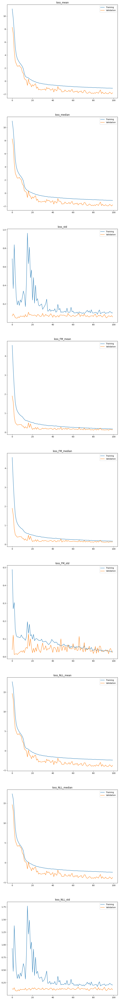

In [ ]:
visualize_training_results(r, loglog = False)

In [ ]:
trainer.load_best_model()

In [ ]:
model = trainer.model

In [ ]:
model.eval()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [ ]:
trainer.load_best_model()

In [ ]:
trainer.model.cuda()

TransformerCNFConditionalDecoderDouble_parallel_learnedBaseDistribution2(
  (encoder): TransformerReturnRepresentations(
    (mlp1): PositionwiseFeedForward(
      (w_1): Linear(in_features=11, out_features=197, bias=True)
      (w_2): Linear(in_features=197, out_features=384, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (act1): LeakyReLU(negative_slope=0.01)
    (encoder_layer): TransformerEncoderLayer(
      (self_attn): MultiheadAttention(
        (out_proj): NonDynamicallyQuantizableLinear(in_features=384, out_features=384, bias=True)
      )
      (linear1): Linear(in_features=384, out_features=768, bias=True)
      (dropout): Dropout(p=0.1, inplace=False)
      (linear2): Linear(in_features=768, out_features=384, bias=True)
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (dropout1): Dropout(p=0.1, inplace=False)
      (dropout2): Dropout(p=0.1, inplace=False)
   

In [ ]:
trainer.test()

100%|██████████| 196/196 [02:03<00:00,  1.59it/s]


{'loss_mean': -1.9610834121704102,
 'loss_median': -1.9683607816696167,
 'loss_std': 0.07674162089824677,
 'loss_FM_mean': 0.138827845454216,
 'loss_FM_median': 0.12759585678577423,
 'loss_FM_std': 0.0430590882897377,
 'loss_NLL_mean': -4.0609941482543945,
 'loss_NLL_median': -4.078352928161621,
 'loss_NLL_std': 0.13707630336284637}

In [ ]:
#?ModelToPosteriorCNF

In [ ]:
N_SAMPLES_PER_MODEL = 1000

In [ ]:
full_model = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=1000,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-6,
    rtol = 1e-6,
    sample_only_base_dist = False,
)

full_model_no_FM = ModelToPosteriorCNF_LearnedBaseDist(
    model = model.eval(),
    sample_name = "beta",
    sample_shape = (P,),
    n_samples=N_SAMPLES_PER_MODEL,
    batch_size = BATCH_SIZE//4,
    solve_adjoint = True,
    atol = 1e-6,
    rtol = 1e6,
    sample_only_base_dist = True,
    name = "full_model_no_FM"
)


benchmark_params_ppgrogram = data_generator.curriculum.get_params(-1)
print(f"params for pprogram: {benchmark_params_ppgrogram}")

pprogram1 = make_lm_program_ig(**benchmark_params_ppgrogram)

pprogram1_y = return_only_y(pprogram1)
print_code(pprogram1)






params for pprogram: {'tau': 1.0, 'a': 5.0, 'b': 2.0}
        def multivariate_lm_return_dict(x: torch.Tensor, y: torch.Tensor = None) -> dict:
                # Define distributions for the global parameters
                sigma_squared_dist = dist.InverseGamma(a, b)

                beta_cov = torch.eye(x.shape[1]) * (tau ** 2)  # the covariance matrix of the parameters of the linear model

                sigma_squared = pyro.sample("sigma_squared", sigma_squared_dist).squeeze()

                beta_dist = dist.MultivariateNormal(torch.zeros(x.shape[1]), beta_cov)
                beta = pyro.sample("beta", beta_dist)

                # Compute mean using matrix multiplication
                mean = torch.matmul(x, beta)

                with pyro.plate("data", len(x)):
                        y = pyro.sample("obs", pyro.distributions.Normal(mean, sigma_squared), obs=y)


                return {
                        "x": x,
                        "y": y,
                      

In [ ]:
hmc_sampler = Hamiltionian_MC(pprogram = pprogram1_y, n_warmup=500, n_samples=N_SAMPLES_PER_MODEL)

vi_diag = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoDiagonalNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_multivariate_normal = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoMultivariateNormal,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)
vi_laplace = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun = AutoLaplaceApproximation,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)

vi_autoIAF = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoIAFNormal,
    #additional_make_guide_args={"num_transforms": 5, "hidden_dim" : 100},
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-3
)

vi_autostrucured = Variational_InferenceAutoguide(
    pprogram=pprogram1_y,
    make_guide_fun=AutoStructured,
    n_steps = 2000,
    n_samples=N_SAMPLES_PER_MODEL,
    lr = 1e-2
)


In [ ]:
evaluation = Evaluate(
    posterior_model = full_model,
    evaluation_loader = trainer.testset,
    comparison_models= [
                        full_model_no_FM,
                        vi_diag,
                        vi_multivariate_normal,
                        vi_laplace,
                        vi_autoIAF,
                        vi_autostrucured,
                        hmc_sampler
                        ],
    n_evaluation_cases=100,
    save_path= SAVE_PATH_EVALUATION,
    overwrite_results = True
)

The save path is not empty and the overwrite flag is set, the results will be overwritten


In [ ]:
evaluation.run_evaluation()

Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:10<17:38, 10.69s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:21<17:43, 10.85s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:32<17:40, 10.93s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:43<17:18, 10.82s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:54<17:21, 10.96s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:05<17:08, 10.94s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:16<17:00, 10.97s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:27<16:47, 10.95s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:38<16:31, 10.90s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:49<16:23, 10.93s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:00<16:21, 11.03s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:11<16:08, 11.01s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:22<15:48, 10.90s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:33<15:42, 10.95s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:43<15:22, 10.85s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:54<15:11, 10.86s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:05<15:09, 10.96s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:16<14:59, 10.97s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:27<14:49, 10.98s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:38<14:31, 10.89s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:49<14:23, 10.93s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:00<14:20, 11.03s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:11<14:03, 10.96s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [04:22<13:50, 10.93s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [04:33<13:52, 11.09s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:44<13:32, 10.98s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:55<13:18, 10.94s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:06<13:06, 10.92s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [05:17<12:59, 10.98s/it]

....................


Sampling posterior:  30%|███       | 30/100 [05:28<12:45, 10.93s/it]

....................


Sampling posterior:  31%|███       | 31/100 [05:38<12:28, 10.85s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:50<12:23, 10.93s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [06:01<12:15, 10.97s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [06:12<12:02, 10.95s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [06:23<11:52, 10.97s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [06:34<11:47, 11.06s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [06:45<11:32, 10.98s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:55<11:15, 10.90s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [07:06<11:02, 10.86s/it]

....................


Sampling posterior:  40%|████      | 40/100 [07:17<10:54, 10.90s/it]

....................


Sampling posterior:  41%|████      | 41/100 [07:28<10:44, 10.93s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [07:39<10:36, 10.98s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [07:50<10:24, 10.96s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [08:01<10:15, 10.99s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [08:12<09:59, 10.91s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [08:23<09:49, 10.91s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [08:34<09:41, 10.97s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [08:45<09:30, 10.98s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [08:56<09:18, 10.96s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [09:07<09:06, 10.94s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [09:18<09:05, 11.14s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [09:29<08:52, 11.10s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [09:40<08:41, 11.09s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [09:52<08:34, 11.18s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [10:02<08:17, 11.05s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [10:14<08:07, 11.08s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [10:24<07:53, 11.02s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [10:36<07:47, 11.14s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [10:47<07:31, 11.02s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [10:58<07:19, 10.99s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [11:09<07:12, 11.09s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [11:20<07:02, 11.13s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [11:31<06:49, 11.07s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [11:42<06:39, 11.08s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [11:53<06:24, 10.99s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [12:04<06:14, 11.01s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [12:15<06:01, 10.95s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [12:26<05:48, 10.89s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [12:37<05:40, 10.97s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [12:48<05:28, 10.94s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [12:58<05:15, 10.87s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [13:09<05:04, 10.88s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [13:20<04:56, 10.98s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [13:31<04:44, 10.94s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [13:42<04:35, 11.02s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [13:53<04:23, 11.00s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [14:04<04:10, 10.90s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [14:15<03:58, 10.86s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [14:25<03:46, 10.79s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [14:37<03:37, 10.89s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [14:47<03:26, 10.88s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [14:58<03:14, 10.82s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [15:09<03:03, 10.78s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [15:20<02:54, 10.92s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [15:31<02:43, 10.90s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [15:42<02:31, 10.85s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [15:53<02:22, 10.95s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [16:04<02:11, 10.94s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [16:14<01:59, 10.88s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [16:25<01:47, 10.77s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [16:36<01:38, 10.95s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [16:47<01:27, 10.92s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [16:58<01:16, 10.90s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [17:09<01:05, 10.87s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [17:20<00:54, 10.90s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [17:31<00:43, 10.87s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [17:41<00:32, 10.86s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [17:53<00:21, 10.99s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [18:03<00:10, 10.90s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:12<21:17, 12.90s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:25<21:08, 12.94s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:38<20:47, 12.86s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:51<20:41, 12.93s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:04<20:24, 12.89s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:17<20:12, 12.90s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:30<20:00, 12.91s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:43<19:50, 12.94s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:56<19:36, 12.93s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:08<19:16, 12.85s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:22<19:12, 12.95s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:34<18:49, 12.84s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:47<18:33, 12.79s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:00<18:24, 12.84s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:13<18:14, 12.87s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:25<17:51, 12.76s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [03:38<17:34, 12.71s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [03:51<17:32, 12.84s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:04<17:13, 12.76s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:16<16:58, 12.73s/it]

....................


Sampling posterior:  21%|██        | 21/100 [04:29<16:52, 12.82s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [04:42<16:37, 12.79s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [04:55<16:25, 12.80s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:07<16:06, 12.72s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [05:20<15:57, 12.77s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [05:33<15:40, 12.70s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [05:46<15:38, 12.85s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [05:59<15:26, 12.87s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [06:12<15:10, 12.82s/it]

....................


Sampling posterior:  30%|███       | 30/100 [06:24<14:56, 12.81s/it]

....................


Sampling posterior:  31%|███       | 31/100 [06:37<14:45, 12.83s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [06:50<14:27, 12.75s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [07:02<14:12, 12.72s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [07:15<14:04, 12.79s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [07:28<13:52, 12.80s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [07:41<13:36, 12.75s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [07:54<13:23, 12.75s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [08:07<13:15, 12.83s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [08:19<12:59, 12.78s/it]

....................


Sampling posterior:  40%|████      | 40/100 [08:32<12:46, 12.78s/it]

....................


Sampling posterior:  41%|████      | 41/100 [08:45<12:38, 12.86s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [08:58<12:24, 12.84s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [09:11<12:09, 12.80s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [09:23<11:56, 12.80s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [09:36<11:48, 12.87s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [09:49<11:32, 12.82s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [10:02<11:19, 12.83s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [10:15<11:04, 12.77s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [10:27<10:47, 12.70s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [10:40<10:31, 12.62s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [10:53<10:26, 12.79s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [11:06<10:16, 12.85s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [11:18<10:01, 12.80s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [11:32<09:52, 12.89s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [11:45<09:41, 12.93s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [11:58<09:29, 12.95s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [12:11<09:18, 12.99s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [12:23<09:03, 12.93s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [12:36<08:44, 12.78s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [12:49<08:34, 12.86s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [13:02<08:22, 12.89s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [13:15<08:11, 12.94s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [13:28<07:55, 12.86s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [13:40<07:40, 12.80s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [13:53<07:28, 12.81s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [14:06<07:11, 12.69s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [14:18<06:58, 12.67s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [14:31<06:48, 12.78s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [14:44<06:36, 12.77s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [14:57<06:21, 12.70s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [15:10<06:13, 12.88s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [15:22<05:57, 12.76s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [15:35<05:47, 12.86s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [15:48<05:33, 12.82s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [16:01<05:21, 12.85s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [16:14<05:07, 12.79s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [16:27<04:54, 12.81s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [16:40<04:42, 12.86s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [16:52<04:28, 12.78s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [17:05<04:13, 12.69s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [17:17<04:01, 12.73s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [17:30<03:47, 12.66s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [17:43<03:35, 12.66s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [17:56<03:25, 12.83s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [18:09<03:12, 12.84s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [18:22<03:01, 12.98s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [18:35<02:48, 12.98s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [18:48<02:35, 12.97s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [19:00<02:20, 12.77s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [19:13<02:07, 12.71s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [19:26<01:55, 12.82s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [19:39<01:42, 12.79s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [19:51<01:29, 12.80s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [20:04<01:15, 12.65s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [20:17<01:03, 12.72s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [20:29<00:50, 12.63s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [20:42<00:37, 12.61s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [20:54<00:25, 12.66s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [21:07<00:12, 12.77s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:09<16:08,  9.78s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:19<15:48,  9.68s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:29<15:48,  9.78s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:38<15:15,  9.53s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [00:48<15:15,  9.64s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [00:57<15:00,  9.58s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:07<14:46,  9.54s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:16<14:42,  9.59s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [01:26<14:30,  9.56s/it]

....................


Sampling posterior:  10%|█         | 10/100 [01:35<14:18,  9.54s/it]

....................


Sampling posterior:  11%|█         | 11/100 [01:45<14:07,  9.53s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [01:54<13:56,  9.51s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [02:04<13:58,  9.64s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [02:14<13:49,  9.64s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [02:23<13:34,  9.58s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [02:33<13:15,  9.48s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [02:42<13:02,  9.42s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [02:52<12:57,  9.48s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [03:01<12:45,  9.45s/it]

....................


Sampling posterior:  20%|██        | 20/100 [03:10<12:36,  9.45s/it]

....................


Sampling posterior:  21%|██        | 21/100 [03:20<12:29,  9.49s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [03:30<12:28,  9.59s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [03:39<12:21,  9.62s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [03:49<12:07,  9.57s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [03:59<11:58,  9.59s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [04:08<11:43,  9.50s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [04:17<11:32,  9.49s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [04:27<11:21,  9.47s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [04:36<11:15,  9.52s/it]

....................


Sampling posterior:  30%|███       | 30/100 [04:46<11:06,  9.52s/it]

....................


Sampling posterior:  31%|███       | 31/100 [04:55<10:55,  9.50s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [05:05<10:43,  9.46s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [05:14<10:40,  9.55s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [05:24<10:27,  9.50s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [05:33<10:18,  9.51s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [05:43<10:07,  9.50s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [05:53<10:03,  9.59s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [06:02<09:48,  9.49s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [06:11<09:34,  9.42s/it]

....................


Sampling posterior:  40%|████      | 40/100 [06:20<09:22,  9.38s/it]

....................


Sampling posterior:  41%|████      | 41/100 [06:30<09:19,  9.48s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [06:40<09:12,  9.53s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [06:49<08:59,  9.47s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [06:59<08:51,  9.50s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [07:08<08:46,  9.58s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [07:18<08:32,  9.50s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [07:27<08:23,  9.50s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [07:37<08:09,  9.42s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [07:46<08:02,  9.46s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [07:56<07:58,  9.57s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [08:05<07:46,  9.52s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [08:15<07:35,  9.48s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [08:24<07:29,  9.57s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [08:34<07:16,  9.49s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [08:43<07:07,  9.49s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [08:53<06:55,  9.44s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [09:02<06:47,  9.48s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [09:12<06:37,  9.47s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [09:21<06:29,  9.49s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [09:31<06:18,  9.46s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [09:40<06:11,  9.52s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [09:50<05:59,  9.47s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [09:59<05:50,  9.47s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [10:09<05:41,  9.50s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [10:18<05:32,  9.50s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [10:27<05:22,  9.47s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [10:37<05:12,  9.45s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [10:46<05:02,  9.44s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [10:56<04:58,  9.63s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [11:06<04:47,  9.58s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [11:15<04:37,  9.57s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [11:25<04:27,  9.54s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [11:35<04:19,  9.60s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [11:44<04:07,  9.50s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [11:53<03:56,  9.45s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [12:03<03:47,  9.47s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [12:13<03:40,  9.57s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [12:22<03:29,  9.51s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [12:31<03:19,  9.49s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [12:41<03:10,  9.52s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [12:51<03:01,  9.56s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [13:00<02:53,  9.65s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [13:10<02:43,  9.64s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [13:20<02:34,  9.65s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [13:29<02:23,  9.58s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [13:39<02:15,  9.66s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [13:48<02:04,  9.57s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [13:58<01:55,  9.59s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [14:08<01:46,  9.64s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [14:17<01:36,  9.61s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [14:27<01:25,  9.52s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [14:36<01:15,  9.47s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [14:46<01:07,  9.66s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [14:55<00:57,  9.57s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [15:05<00:48,  9.66s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [15:15<00:38,  9.56s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [15:24<00:28,  9.55s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [15:34<00:19,  9.64s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [15:44<00:09,  9.65s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:14<24:01, 14.56s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:28<23:37, 14.46s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:43<23:08, 14.31s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [00:57<23:16, 14.54s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:12<22:59, 14.52s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:27<22:52, 14.60s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:41<22:30, 14.52s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [01:55<22:07, 14.43s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:10<21:53, 14.43s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:24<21:38, 14.43s/it]

....................


Sampling posterior:  11%|█         | 11/100 [02:39<21:37, 14.58s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [02:54<21:23, 14.59s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:08<21:09, 14.59s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:23<20:49, 14.53s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [03:37<20:37, 14.56s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [03:52<20:21, 14.55s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:07<20:13, 14.62s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:21<19:54, 14.57s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [04:36<19:37, 14.54s/it]

....................


Sampling posterior:  20%|██        | 20/100 [04:50<19:26, 14.58s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:05<19:20, 14.69s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [05:20<19:10, 14.75s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [05:34<18:47, 14.65s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [05:49<18:28, 14.58s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:03<18:06, 14.48s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [06:18<17:53, 14.51s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [06:32<17:37, 14.48s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [06:47<17:26, 14.54s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:01<17:14, 14.57s/it]

....................


Sampling posterior:  30%|███       | 30/100 [07:16<17:04, 14.64s/it]

....................


Sampling posterior:  31%|███       | 31/100 [07:31<16:44, 14.56s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [07:45<16:33, 14.61s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [08:00<16:09, 14.47s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [08:14<15:57, 14.51s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [08:29<15:44, 14.54s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [08:43<15:32, 14.57s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [08:58<15:20, 14.61s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [09:13<15:15, 14.77s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [09:28<14:57, 14.72s/it]

....................


Sampling posterior:  40%|████      | 40/100 [09:43<14:45, 14.77s/it]

....................


Sampling posterior:  41%|████      | 41/100 [09:57<14:23, 14.63s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [10:12<14:12, 14.70s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [10:27<14:02, 14.78s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [10:41<13:38, 14.62s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [10:56<13:22, 14.59s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [11:10<13:12, 14.68s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [11:25<12:52, 14.58s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [11:39<12:37, 14.56s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [11:53<12:16, 14.44s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [12:08<12:07, 14.56s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [12:24<12:03, 14.77s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [12:38<11:42, 14.63s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [12:53<11:37, 14.84s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [13:08<11:15, 14.69s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [13:23<11:11, 14.91s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [13:38<10:52, 14.83s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [13:52<10:35, 14.77s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [14:07<10:14, 14.63s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [14:21<10:01, 14.67s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [14:36<09:52, 14.80s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [14:51<09:30, 14.62s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [15:05<09:15, 14.63s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [15:20<09:02, 14.67s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [15:34<08:44, 14.57s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [15:49<08:31, 14.60s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [16:03<08:14, 14.54s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [16:18<08:03, 14.67s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [16:33<07:50, 14.71s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [16:48<07:34, 14.67s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [17:03<07:20, 14.70s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [17:17<07:02, 14.57s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [17:31<06:48, 14.59s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [17:46<06:36, 14.69s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [18:01<06:21, 14.66s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [18:16<06:07, 14.70s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [18:30<05:51, 14.64s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [18:45<05:34, 14.54s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [18:59<05:18, 14.47s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [19:13<05:03, 14.43s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [19:28<04:50, 14.50s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [19:42<04:34, 14.43s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [19:57<04:20, 14.45s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [20:11<04:05, 14.42s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [20:25<03:50, 14.41s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [20:40<03:36, 14.44s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [20:54<03:21, 14.39s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [21:08<03:06, 14.32s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [21:23<02:52, 14.37s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [21:37<02:38, 14.38s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [21:52<02:23, 14.36s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [22:06<02:09, 14.37s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [22:20<01:55, 14.41s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [22:35<01:41, 14.49s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [22:49<01:26, 14.42s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [23:04<01:12, 14.42s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [23:19<00:58, 14.57s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [23:33<00:43, 14.54s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [23:48<00:29, 14.58s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [24:02<00:14, 14.47s/it]

....................


Sampling posterior:   0%|          | 0/100 [00:00<?, ?it/s]

....................


Sampling posterior:   1%|          | 1/100 [00:16<27:32, 16.69s/it]

....................


Sampling posterior:   2%|▏         | 2/100 [00:33<27:31, 16.85s/it]

....................


Sampling posterior:   3%|▎         | 3/100 [00:49<26:51, 16.62s/it]

....................


Sampling posterior:   4%|▍         | 4/100 [01:06<26:42, 16.69s/it]

....................


Sampling posterior:   5%|▌         | 5/100 [01:23<26:10, 16.53s/it]

....................


Sampling posterior:   6%|▌         | 6/100 [01:39<26:01, 16.61s/it]

....................


Sampling posterior:   7%|▋         | 7/100 [01:56<25:35, 16.51s/it]

....................


Sampling posterior:   8%|▊         | 8/100 [02:13<25:32, 16.66s/it]

....................


Sampling posterior:   9%|▉         | 9/100 [02:29<25:09, 16.59s/it]

....................


Sampling posterior:  10%|█         | 10/100 [02:45<24:46, 16.52s/it]

....................


Sampling posterior:  11%|█         | 11/100 [03:02<24:30, 16.52s/it]

....................


Sampling posterior:  12%|█▏        | 12/100 [03:19<24:17, 16.56s/it]

....................


Sampling posterior:  13%|█▎        | 13/100 [03:35<23:59, 16.54s/it]

....................


Sampling posterior:  14%|█▍        | 14/100 [03:52<23:48, 16.61s/it]

....................


Sampling posterior:  15%|█▌        | 15/100 [04:08<23:24, 16.53s/it]

....................


Sampling posterior:  16%|█▌        | 16/100 [04:24<22:59, 16.42s/it]

....................


Sampling posterior:  17%|█▋        | 17/100 [04:41<22:47, 16.47s/it]

....................


Sampling posterior:  18%|█▊        | 18/100 [04:57<22:17, 16.32s/it]

....................


Sampling posterior:  19%|█▉        | 19/100 [05:13<22:00, 16.30s/it]

....................


Sampling posterior:  20%|██        | 20/100 [05:30<21:50, 16.38s/it]

....................


Sampling posterior:  21%|██        | 21/100 [05:46<21:41, 16.47s/it]

....................


Sampling posterior:  22%|██▏       | 22/100 [06:03<21:20, 16.42s/it]

....................


Sampling posterior:  23%|██▎       | 23/100 [06:19<21:09, 16.48s/it]

....................


Sampling posterior:  24%|██▍       | 24/100 [06:36<20:47, 16.41s/it]

....................


Sampling posterior:  25%|██▌       | 25/100 [06:52<20:35, 16.48s/it]

....................


Sampling posterior:  26%|██▌       | 26/100 [07:08<20:14, 16.41s/it]

....................


Sampling posterior:  27%|██▋       | 27/100 [07:25<19:59, 16.44s/it]

....................


Sampling posterior:  28%|██▊       | 28/100 [07:41<19:39, 16.38s/it]

....................


Sampling posterior:  29%|██▉       | 29/100 [07:58<19:25, 16.42s/it]

....................


Sampling posterior:  30%|███       | 30/100 [08:14<19:11, 16.46s/it]

....................


Sampling posterior:  31%|███       | 31/100 [08:31<18:58, 16.51s/it]

....................


Sampling posterior:  32%|███▏      | 32/100 [08:48<18:47, 16.58s/it]

....................


Sampling posterior:  33%|███▎      | 33/100 [09:04<18:33, 16.61s/it]

....................


Sampling posterior:  34%|███▍      | 34/100 [09:20<18:06, 16.46s/it]

....................


Sampling posterior:  35%|███▌      | 35/100 [09:37<17:49, 16.46s/it]

....................


Sampling posterior:  36%|███▌      | 36/100 [09:53<17:30, 16.42s/it]

....................


Sampling posterior:  37%|███▋      | 37/100 [10:10<17:21, 16.54s/it]

....................


Sampling posterior:  38%|███▊      | 38/100 [10:27<17:12, 16.65s/it]

....................


Sampling posterior:  39%|███▉      | 39/100 [10:43<16:45, 16.49s/it]

....................


Sampling posterior:  40%|████      | 40/100 [11:00<16:33, 16.56s/it]

....................


Sampling posterior:  41%|████      | 41/100 [11:16<16:15, 16.53s/it]

....................


Sampling posterior:  42%|████▏     | 42/100 [11:32<15:50, 16.39s/it]

....................


Sampling posterior:  43%|████▎     | 43/100 [11:49<15:36, 16.44s/it]

....................


Sampling posterior:  44%|████▍     | 44/100 [12:06<15:29, 16.60s/it]

....................


Sampling posterior:  45%|████▌     | 45/100 [12:22<15:12, 16.58s/it]

....................


Sampling posterior:  46%|████▌     | 46/100 [12:39<14:50, 16.50s/it]

....................


Sampling posterior:  47%|████▋     | 47/100 [12:55<14:33, 16.49s/it]

....................


Sampling posterior:  48%|████▊     | 48/100 [13:12<14:15, 16.46s/it]

....................


Sampling posterior:  49%|████▉     | 49/100 [13:28<14:06, 16.60s/it]

....................


Sampling posterior:  50%|█████     | 50/100 [13:46<13:58, 16.78s/it]

....................


Sampling posterior:  51%|█████     | 51/100 [14:02<13:34, 16.62s/it]

....................


Sampling posterior:  52%|█████▏    | 52/100 [14:18<13:14, 16.54s/it]

....................


Sampling posterior:  53%|█████▎    | 53/100 [14:35<12:54, 16.48s/it]

....................


Sampling posterior:  54%|█████▍    | 54/100 [14:51<12:43, 16.59s/it]

....................


Sampling posterior:  55%|█████▌    | 55/100 [15:08<12:28, 16.64s/it]

....................


Sampling posterior:  56%|█████▌    | 56/100 [15:25<12:13, 16.68s/it]

....................


Sampling posterior:  57%|█████▋    | 57/100 [15:41<11:48, 16.49s/it]

....................


Sampling posterior:  58%|█████▊    | 58/100 [15:57<11:29, 16.41s/it]

....................


Sampling posterior:  59%|█████▉    | 59/100 [16:14<11:20, 16.61s/it]

....................


Sampling posterior:  60%|██████    | 60/100 [16:31<11:05, 16.65s/it]

....................


Sampling posterior:  61%|██████    | 61/100 [16:48<10:53, 16.75s/it]

....................


Sampling posterior:  62%|██████▏   | 62/100 [17:05<10:39, 16.82s/it]

....................


Sampling posterior:  63%|██████▎   | 63/100 [17:23<10:31, 17.07s/it]

....................


Sampling posterior:  64%|██████▍   | 64/100 [17:40<10:13, 17.04s/it]

....................


Sampling posterior:  65%|██████▌   | 65/100 [17:57<09:55, 17.02s/it]

....................


Sampling posterior:  66%|██████▌   | 66/100 [18:13<09:33, 16.86s/it]

....................


Sampling posterior:  67%|██████▋   | 67/100 [18:30<09:12, 16.76s/it]

....................


Sampling posterior:  68%|██████▊   | 68/100 [18:46<08:55, 16.72s/it]

....................


Sampling posterior:  69%|██████▉   | 69/100 [19:03<08:36, 16.66s/it]

....................


Sampling posterior:  70%|███████   | 70/100 [19:19<08:16, 16.56s/it]

....................


Sampling posterior:  71%|███████   | 71/100 [19:36<08:01, 16.62s/it]

....................


Sampling posterior:  72%|███████▏  | 72/100 [19:52<07:40, 16.45s/it]

....................


Sampling posterior:  73%|███████▎  | 73/100 [20:09<07:25, 16.50s/it]

....................


Sampling posterior:  74%|███████▍  | 74/100 [20:26<07:12, 16.64s/it]

....................


Sampling posterior:  75%|███████▌  | 75/100 [20:42<06:54, 16.58s/it]

....................


Sampling posterior:  76%|███████▌  | 76/100 [20:59<06:38, 16.59s/it]

....................


Sampling posterior:  77%|███████▋  | 77/100 [21:15<06:20, 16.56s/it]

....................


Sampling posterior:  78%|███████▊  | 78/100 [21:31<06:01, 16.45s/it]

....................


Sampling posterior:  79%|███████▉  | 79/100 [21:47<05:44, 16.38s/it]

....................


Sampling posterior:  80%|████████  | 80/100 [22:04<05:30, 16.52s/it]

....................


Sampling posterior:  81%|████████  | 81/100 [22:21<05:13, 16.52s/it]

....................


Sampling posterior:  82%|████████▏ | 82/100 [22:37<04:57, 16.53s/it]

....................


Sampling posterior:  83%|████████▎ | 83/100 [22:54<04:40, 16.51s/it]

....................


Sampling posterior:  84%|████████▍ | 84/100 [23:10<04:22, 16.43s/it]

....................


Sampling posterior:  85%|████████▌ | 85/100 [23:26<04:05, 16.37s/it]

....................


Sampling posterior:  86%|████████▌ | 86/100 [23:43<03:49, 16.36s/it]

....................


Sampling posterior:  87%|████████▋ | 87/100 [23:59<03:33, 16.41s/it]

....................


Sampling posterior:  88%|████████▊ | 88/100 [24:16<03:16, 16.39s/it]

....................


Sampling posterior:  89%|████████▉ | 89/100 [24:32<03:01, 16.50s/it]

....................


Sampling posterior:  90%|█████████ | 90/100 [24:49<02:44, 16.48s/it]

....................


Sampling posterior:  91%|█████████ | 91/100 [25:05<02:28, 16.54s/it]

....................


Sampling posterior:  92%|█████████▏| 92/100 [25:22<02:12, 16.62s/it]

....................


Sampling posterior:  93%|█████████▎| 93/100 [25:39<01:56, 16.60s/it]

....................


Sampling posterior:  94%|█████████▍| 94/100 [25:55<01:38, 16.48s/it]

....................


Sampling posterior:  95%|█████████▌| 95/100 [26:12<01:22, 16.59s/it]

....................


Sampling posterior:  96%|█████████▌| 96/100 [26:28<01:05, 16.46s/it]

....................


Sampling posterior:  97%|█████████▋| 97/100 [26:44<00:49, 16.44s/it]

....................


Sampling posterior:  98%|█████████▊| 98/100 [27:01<00:32, 16.38s/it]

....................


Sampling posterior:  99%|█████████▉| 99/100 [27:17<00:16, 16.35s/it]

....................


100%|██████████| 100/100 [00:00<00:00, 649.64it/s]


An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_MAP: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covariance matrix, which cannot be treated using the algorithms implemented in `gaussian_kde`. Consider performing principle component analysis / dimensionality reduction and using `gaussian_kde` with the transformed data.
An exception occured in compare_to_gt_perplexity_kde: The data appears to lie in a lower-dimensional subspace of the space in which it is expressed. This has resulted in a singular data covaria

100%|██████████| 100/100 [05:32<00:00,  3.32s/it]


Comparison to ground truth:

Summarized results:


,Model,GT,Mean_joint_Wasserstein_distance with metric euclidean,Mean_joint_MMD,Mean_joint_cst_roc_auc,Mean_gt_parameter_Perplextiy,Mean_gt_parameter_MAP diff,Mean_gt_parameter_Mean diff,Std_joint_Wasserstein_distance with metric euclidean,Std_joint_MMD,Std_joint_cst_roc_auc,Std_gt_parameter_Perplextiy,Std_gt_parameter_MAP diff,Std_gt_parameter_Mean diff
0,ModelToPosteriorCNF_LearnedBaseDist,gt,19.719307,0.043637,0.51700,3.157619,0.154692,0.143460,0.004103,0.000074,0.029576,3.899807,0.070981,0.067766
1,full_model_no_FM,gt,19.717416,0.043671,0.51610,3.236464,0.152284,0.144472,0.004337,0.000072,0.034477,4.019107,0.068290,0.067833
2,Variational Inference with guide: AutoDiagonal...,gt,19.715465,0.043678,0.51675,-12.500449,0.150553,0.146998,0.001797,0.000036,0.032258,30.013064,0.090840,0.087807
3,Variational Inference with guide: AutoMultivar...,gt,19.720803,0.043651,0.52030,3.314592,0.153943,0.145813,0.003734,0.000065,0.030450,10.692763,0.092682,0.085062
4,Variational Inference with guide: AutoLaplaceA...,gt,19.716621,0.043677,0.52115,NaN,NaN,0.144724,0.000000,0.000000,0.033529,NaN,NaN,0.086397
5,Variational Inference with guide: AutoIAFNorma...,gt,19.698082,0.043729,0.51235,-23.557138,0.251090,0.243286,0.003916,0.000076,0.031192,73.054934,0.217596,0.220285
6,Variational Inference with guide: AutoStructur...,gt,19.722352,0.043669,0.51330,3.829475,0.155266,0.145519,0.004025,0.000058,0.038861,6.569075,0.088011,0.082556
7,Hamiltonian Monte Carlo,gt,19.728284,0.043579,0.51160,5.114112,0.135628,0.131656,0.003650,0.000067,0.041444,4.966407,0.073375,0.069034


P-values:


,Model 1,Model 2,joint_Wasserstein_distance with metric euclidean_p-value,joint_MMD_p-value,joint_cst_roc_auc_p-value,gt_parameter_Perplextiy_p-value,gt_parameter_MAP diff_p-value,gt_parameter_Mean diff_p-value
0,ModelToPosteriorCNF_LearnedBaseDist,full_model_no_FM,2.537368e-03,3.916951e-03,0.819417,3.550130e-01,3.862391e-01,7.378748e-02
1,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoDiagonal...,1.318182e-11,7.954419e-06,0.966990,2.991251e-14,4.283950e-05,3.588225e-03
2,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoMultivar...,8.359472e-03,7.323311e-02,0.305492,8.493117e-07,8.530491e-03,4.759665e-03
3,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoLaplaceA...,1.267185e-08,9.855657e-07,0.491728,NaN,NaN,1.523679e-03
4,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoIAFNorma...,3.896560e-18,1.835964e-11,0.256764,2.409939e-02,2.979018e-04,4.036859e-05
5,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoStructur...,3.232678e-07,2.218759e-03,0.500980,1.921368e-05,2.519827e-02,7.025214e-03
6,ModelToPosteriorCNF_LearnedBaseDist,Hamiltonian Monte Carlo,1.847790e-17,1.778559e-07,0.307334,5.887336e-11,1.011962e-06,1.408967e-07
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,9.319468e-05,4.092519e-01,0.827302,3.071760e-14,1.754766e-03,3.072422e-03
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,7.995725e-08,4.519473e-02,0.313658,8.214827e-06,6.433968e-02,3.321214e-03
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,9.136949e-02,3.452591e-01,0.419046,NaN,NaN,7.435485e-04



Comparison among models:

Summarized results:


,Model 1,Model 2,Mean_Wasserstein_distance with metric euclidean,Mean_MMD,Mean_cst_roc_auc,Std_Wasserstein_distance with metric euclidean,Std_MMD,Std_cst_roc_auc
0,ModelToPosteriorCNF_LearnedBaseDist,full_model_no_FM,0.387139,0.009296,0.509725,0.121285,0.004588,0.018045
1,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoDiagonal...,0.520852,1.126452,0.950160,0.219892,0.578408,0.029746
2,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoMultivar...,0.465991,0.379191,0.772990,0.217243,0.531645,0.094054
3,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoLaplaceA...,0.681099,2.464042,1.000000,0.257086,0.472908,0.000000
4,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoIAFNorma...,0.910300,1.203679,0.853130,0.880007,1.632405,0.105907
5,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoStructur...,0.464171,0.377661,0.768300,0.211301,0.477901,0.100523
6,ModelToPosteriorCNF_LearnedBaseDist,Hamiltonian Monte Carlo,0.430747,0.283269,0.759840,0.124731,0.260250,0.087893
7,full_model_no_FM,Variational Inference with guide: AutoDiagonal...,0.523308,1.138966,0.950060,0.215166,0.572044,0.029633
8,full_model_no_FM,Variational Inference with guide: AutoMultivar...,0.468827,0.390189,0.778515,0.212514,0.523934,0.092570
9,full_model_no_FM,Variational Inference with guide: AutoLaplaceA...,0.683452,2.475725,1.000000,0.254072,0.462937,0.000000


P-values:


,Pair 1: Model A,Pair 1: Model B,Pair 2: Model A,Pair 2: Model B,Wasserstein_distance with metric euclidean_p-value,MMD_p-value,cst_roc_auc_p-value
0,ModelToPosteriorCNF_LearnedBaseDist,full_model_no_FM,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoDiagonal...,3.820653e-10,2.562144e-34,2.554937e-34
1,ModelToPosteriorCNF_LearnedBaseDist,full_model_no_FM,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoMultivar...,4.360292e-04,2.562144e-34,2.556233e-34
2,ModelToPosteriorCNF_LearnedBaseDist,full_model_no_FM,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoLaplaceA...,2.832664e-22,2.562144e-34,5.624695e-39
3,ModelToPosteriorCNF_LearnedBaseDist,full_model_no_FM,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoIAFNorma...,5.406911e-11,2.562144e-34,2.477097e-34
4,ModelToPosteriorCNF_LearnedBaseDist,full_model_no_FM,ModelToPosteriorCNF_LearnedBaseDist,Variational Inference with guide: AutoStructur...,4.280698e-04,2.640284e-34,2.556377e-34
...,...,...,...,...,...,...,...
163,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,7.646996e-01,1.186858e-14,2.638670e-31
164,Variational Inference with guide: AutoLaplaceA...,Hamiltonian Monte Carlo,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,2.512409e-09,1.024478e-30,2.154208e-38
165,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoIAFNorma...,Hamiltonian Monte Carlo,9.522647e-01,6.451008e-01,5.895878e-01
166,Variational Inference with guide: AutoIAFNorma...,Variational Inference with guide: AutoStructur...,Variational Inference with guide: AutoStructur...,Hamiltonian Monte Carlo,1.762913e-07,5.457993e-25,3.559069e-25


{'summarized_results': {'comparison_to_gt':                                                Model  GT  \
  0                ModelToPosteriorCNF_LearnedBaseDist  gt   
  1                                   full_model_no_FM  gt   
  2  Variational Inference with guide: AutoDiagonal...  gt   
  3  Variational Inference with guide: AutoMultivar...  gt   
  4  Variational Inference with guide: AutoLaplaceA...  gt   
  5  Variational Inference with guide: AutoIAFNorma...  gt   
  6  Variational Inference with guide: AutoStructur...  gt   
  7                            Hamiltonian Monte Carlo  gt   
  
     Mean_joint_Wasserstein_distance with metric euclidean  Mean_joint_MMD  \
  0                                          19.719307            0.043637   
  1                                          19.717416            0.043671   
  2                                          19.715465            0.043678   
  3                                          19.720803            0.043651   
  4    

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

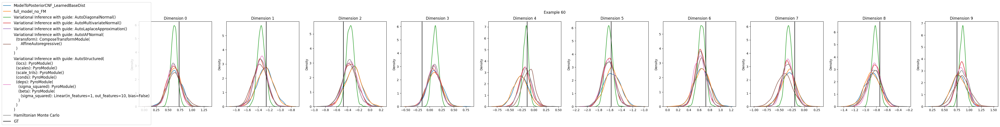

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

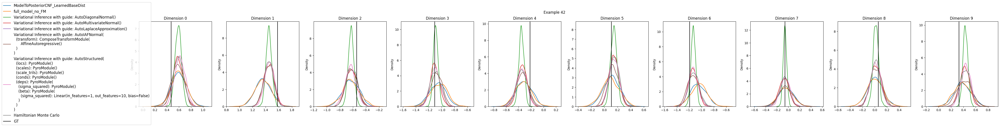

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

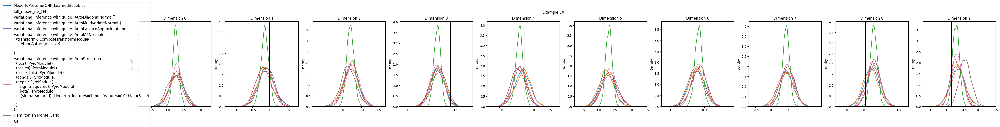

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

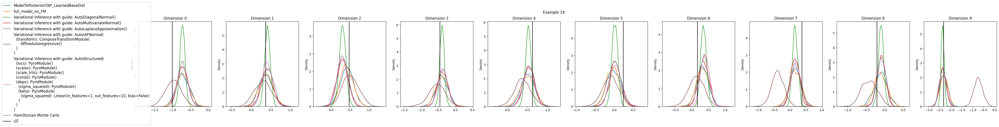

/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(samples[:, j], ax = ax[j], color = model_color[model])
/content/PFNExperiments/Evaluation/Plot.py:81: UserWarning: Dataset has 

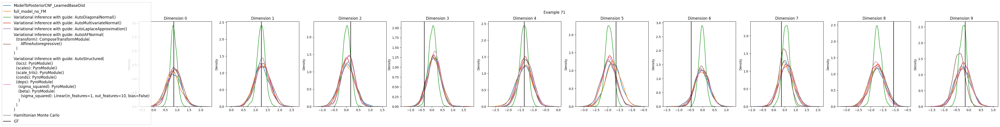

In [ ]:
evaluation.plot_results()